<a href="https://colab.research.google.com/github/Ximena5745/Developer/blob/main/CREMA_D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importación de librerias

In [ ]:
pip install praat-parselmouth

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 52.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import os
import sys
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import parselmouth
from transformers import pipeline
from parselmouth.praat import call

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from IPython.display import Audio
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Importación de dataset

In [ ]:
# Ruta del dataset CREMA-D
Crema = '/content/drive/MyDrive/CREMA-D/AudioWAV'

# Obtener lista de archivos en el directorio
crema_directory_list = os.listdir(Crema)

# Inicializar listas
file_path = []
file_emotion = []
sampling_rates = []
durations = []
max_amplitudes = []
min_amplitudes = []
zero_crossing_rates = []
chroma_features = []
mfcc_features = []
rms_values = []
spectral_entropies = []
fundamental_frequencies = []
formant_f1 = []
formant_f2 = []
harmonicities = []


In [ ]:
# Corregir la concatenación de la ruta del archivo
for file in crema_directory_list:
    # Almacenar rutas de los archivos
    full_path = os.path.join(Crema, file)
    file_path.append(full_path)  # Ruta completa
    # Almacenar emociones de los archivos
    part = file.split('_')
    if part[2] == 'SAD':
        file_emotion.append('sad')
    elif part[2] == 'ANG':
        file_emotion.append('angry')
    elif part[2] == 'DIS':
        file_emotion.append('disgust')
    elif part[2] == 'FEA':
        file_emotion.append('fear')
    elif part[2] == 'HAP':
        file_emotion.append('happy')
    elif part[2] == 'NEU':
        file_emotion.append('neutral')
    else:
        file_emotion.append('Unknown')

# Generación de features

In [ ]:
# Función optimizada para obtener características del audio
def get_audio_features(y, sr, sound):
    features = {}

    try:
        # Frecuencia de muestreo y duración
        features['sr'] = sr
        features['duration'] = librosa.get_duration(y=y, sr=sr)

        # Amplitud máxima y mínima
        features['max_amplitude'] = np.max(np.abs(y))
        features['min_amplitude'] = np.min(np.abs(y))

        # Tasa de cruce por cero
        features['zero_crossing_rate'] = np.mean(librosa.feature.zero_crossing_rate(y)[0])

        # Características Chroma
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        features['chroma'] = np.mean(chroma, axis=1)

        # MFCC
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        features['mfcc'] = np.mean(mfcc, axis=1)

        # RMS
        rms = librosa.feature.rms(y=y)
        features['rms'] = np.mean(rms)

        # Entropía espectral
        spectral_entropy = -np.sum(np.square(np.abs(y)) * np.log(np.square(np.abs(y)) + 1e-10))  # Añadir epsilon para evitar log(0)
        features['spectral_entropy'] = spectral_entropy

        # Frecuencia fundamental (pitch)
        pitch = call(sound, "To Pitch", 0.0, 75, 600)
        features['f0_median'] = call(pitch, "Get quantile", 0.0, 0.0, 0.5, "Hertz")

        # Formantes (F1 y F2)
        formant = call(sound, "To Formant (burg)", 0.0, 5, 5500, 0.025, 50.0)
        features['formant_f1'] = call(formant, "Get value at time", 1, 0.5, "Hertz", "Linear")
        features['formant_f2'] = call(formant, "Get value at time", 2, 0.5, "Hertz", "Linear")

        # Armónicos a ruido (HNR)
        harmonicity = call(sound, "To Harmonicity (cc)", 0.01, 75, 0.1, 1.0)
        features['harmonicity'] = call(harmonicity, "Get mean", 0.0, 0.0)

    except Exception as e:
        print(f"Error al obtener características: {e}")
        # Registrar valores nulos si ocurre un error
        features = {key: None for key in ['sr', 'duration', 'max_amplitude', 'min_amplitude', 'zero_crossing_rate',
                                          'chroma', 'mfcc', 'rms', 'spectral_entropy', 'f0_median',
                                          'formant_f1', 'formant_f2', 'harmonicity']}

    return features

# Iterar sobre los archivos
for file in crema_directory_list:
    full_path = os.path.join(Crema, file)

    try:
        # Cargar archivo de audio usando librosa
        y, sr = librosa.load(full_path, sr=None)

        # Validar duración del audio
        if librosa.get_duration(y=y, sr=sr) > 0.1:
            sound = parselmouth.Sound(full_path)

            # Obtener las características del audio
            features = get_audio_features(y, sr, sound)

            # Agregar valores a las listas correspondientes
            sampling_rates.append(features['sr'])
            durations.append(features['duration'])
            max_amplitudes.append(features['max_amplitude'])
            min_amplitudes.append(features['min_amplitude'])
            zero_crossing_rates.append(features['zero_crossing_rate'])
            chroma_features.append(features['chroma'])
            mfcc_features.append(features['mfcc'])
            rms_values.append(features['rms'])
            spectral_entropies.append(features['spectral_entropy'])
            fundamental_frequencies.append(features['f0_median'])
            formant_f1.append(features['formant_f1'])
            formant_f2.append(features['formant_f2'])
            harmonicities.append(features['harmonicity'])

        else:
            # Si la duración es muy corta, agregar valores nulos
            for lst in [sampling_rates, durations, max_amplitudes, min_amplitudes, zero_crossing_rates,
                        chroma_features, mfcc_features, rms_values, spectral_entropies,
                        fundamental_frequencies, formant_f1, formant_f2, harmonicities]:
                lst.append(None)

    except Exception as e:
        print(f"Error al cargar el archivo {file}: {e}")
        # En caso de error, agregar valores nulos a las listas
        for lst in [sampling_rates, durations, max_amplitudes, min_amplitudes, zero_crossing_rates,
                    chroma_features, mfcc_features, rms_values, spectral_entropies,
                    fundamental_frequencies, formant_f1, formant_f2, harmonicities]:
            lst.append(None)


/usr/local/lib/python3.10/dist-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


In [ ]:
print("Longitudes de las listas:")
print("file_emotion:", len(file_emotion))
print("file_path:", len(file_path))
print("sampling_rates:", len(sampling_rates))
print("durations:", len(durations))
print("fundamental_frequencies:", len(fundamental_frequencies))
print("max_amplitudes:", len(max_amplitudes))
print("min_amplitudes:", len(min_amplitudes))
print("zero_crossing_rates:", len(zero_crossing_rates))
print("chroma_features:", len(chroma_features))
print("mfcc_features:", len(mfcc_features))
print("rms_values:", len(rms_values))
print("spectral_entropies:", len(spectral_entropies))
print("formant_f1:", len(formant_f1))
print("formant_f2:", len(formant_f2))
print("harmonicities:", len(harmonicities))


Longitudes de las listas:
file_emotion: 7442
file_path: 7442
sampling_rates: 7442
durations: 7442
fundamental_frequencies: 7442
max_amplitudes: 7442
min_amplitudes: 7442
zero_crossing_rates: 7442
chroma_features: 7442
mfcc_features: 7442
rms_values: 7442
spectral_entropies: 7442
formant_f1: 7442
formant_f2: 7442
harmonicities: 7442


# Creación de dataset

In [ ]:
# Crear el DataFrame
emotion_df = pd.DataFrame({
    'Registro': range(1, len(file_emotion) + 1),  # Numeración de registros
    'Emocion': file_emotion,
    'Path': file_path,
    'Frecuencia de muestreo': sampling_rates,
    'Duración (s)': durations,
    'Frecuencia Fundamental (Hz)': fundamental_frequencies,
    'Amplitud Máxima': max_amplitudes,
    'Amplitud Mínima': min_amplitudes,
    'Tasa de Cruce por Cero': zero_crossing_rates,
    'Chroma STFT': chroma_features,  # No se necesita convertir a lista
    'MFCC': mfcc_features,  # No se necesita convertir a lista
    'Valor RMS': rms_values,
    'Entropía Espectral': spectral_entropies,
    'Formante F1 (Hz)': formant_f1,
    'Formante F2 (Hz)': formant_f2,
    'HNR (Harmonicity)': harmonicities
})

# Filtrar filas con frecuencias de muestreo válidas (excluir valores None)
emotion_df = emotion_df.dropna(subset=['Frecuencia de muestreo'])

# Guardar el DataFrame como archivo CSV
file_path_csv = '/content/drive/MyDrive/emotion_audio_features.csv'
emotion_df.to_csv(file_path_csv, index=False)

# Guardar el DataFrame como archivo Excel
file_path_excel = '/content/drive/MyDrive/emotion_audio_features.xlsx'
emotion_df.to_excel(file_path_excel, index=False)

# Devolver las rutas para descargar los archivos
file_path_excel, file_path_csv

('/content/drive/MyDrive/emotion_audio_features.xlsx',
 '/content/drive/MyDrive/emotion_audio_features.csv')

In [ ]:
# Ruta del archivo CSV que deseas importar
file_path_csv = '/content/drive/MyDrive/emotion_audio_features.csv'
# Leer el archivo CSV
emotion_df = pd.read_csv(file_path_csv)

# Mostrar las primeras filas del DataFrame importado
print(emotion_df.head())


   Registro  Emocion                                               Path  \
0         1  neutral  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
1         2  disgust  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
2         3    happy  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
3         4      sad  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
4         5    happy  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_W...   

   Frecuencia de muestreo  Duración (s)  Frecuencia Fundamental (Hz)  \
0                   16000      2.502500                   115.055766   
1                   16000      3.303313                   178.549194   
2                   16000      2.369063                   344.494855   
3                   16000      3.169812                   187.379523   
4                   16000      2.736063                   496.760788   

   Amplitud Máxima  Amplitud Mínima  Tasa de Cruce por Cero  \
0         0.100647              0.0                0.

# Exploración de datos

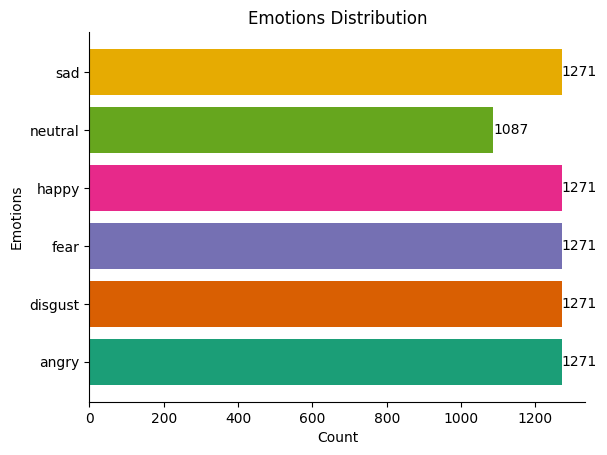

In [ ]:
# Agrupar datos por 'Emocion' y obtener el conteo
emotion_counts = emotion_df.groupby('Emocion').size()

# Definir una paleta de colores
colors = sns.color_palette('Dark2', len(emotion_counts))

# Crear un gráfico de barras horizontal
plt.barh(emotion_counts.index, emotion_counts.values, color=colors)

# Añadir etiquetas a cada barra
for index, value in enumerate(emotion_counts.values):
    plt.text(value, index, str(value), va='center')

# Quitar las líneas de los ejes superior y derecho
plt.gca().spines[['top', 'right']].set_visible(False)

# Etiquetas y título del gráfico
plt.xlabel('Count')
plt.ylabel('Emotions')
plt.title('Emotions Distribution')

# Mostrar el gráfico
plt.show()

Procesando 1087 archivos para la emoción: neutral


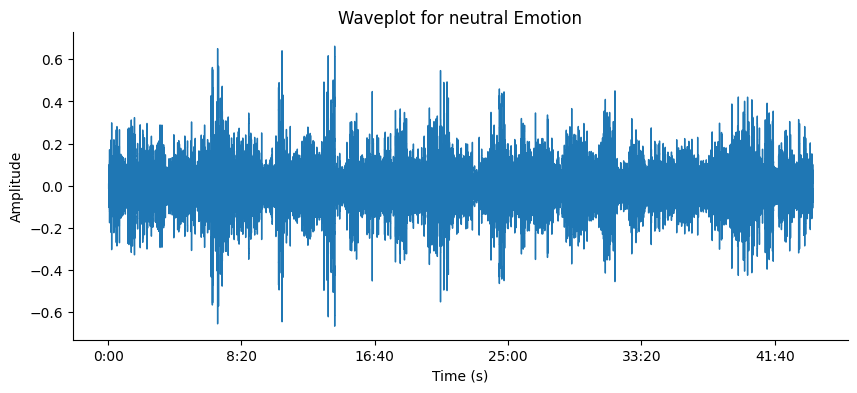

Procesando 1271 archivos para la emoción: disgust


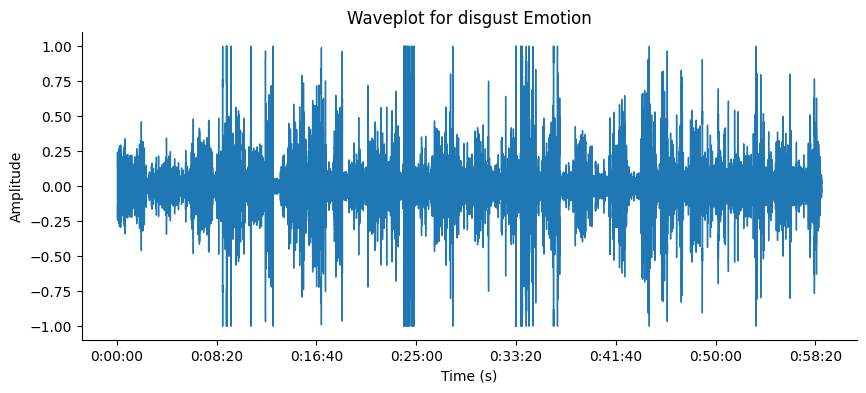

Procesando 1271 archivos para la emoción: happy


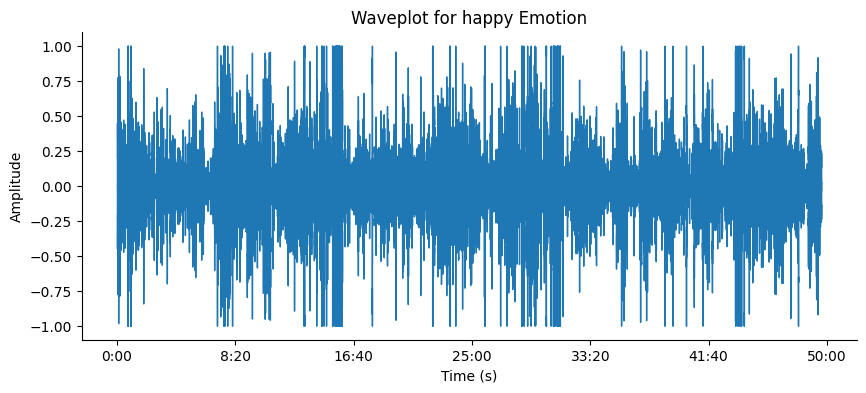

Procesando 1271 archivos para la emoción: sad


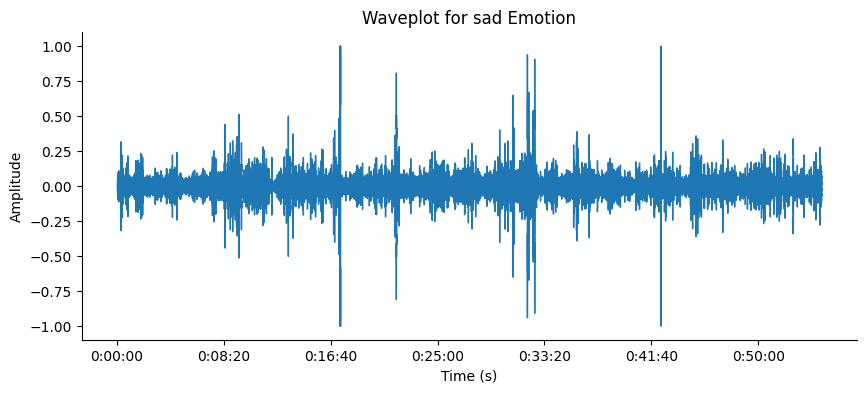

Procesando 1271 archivos para la emoción: angry


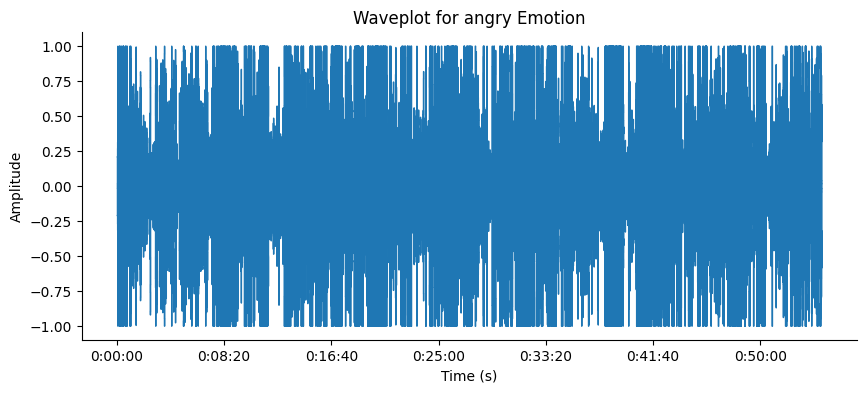

Procesando 1271 archivos para la emoción: fear


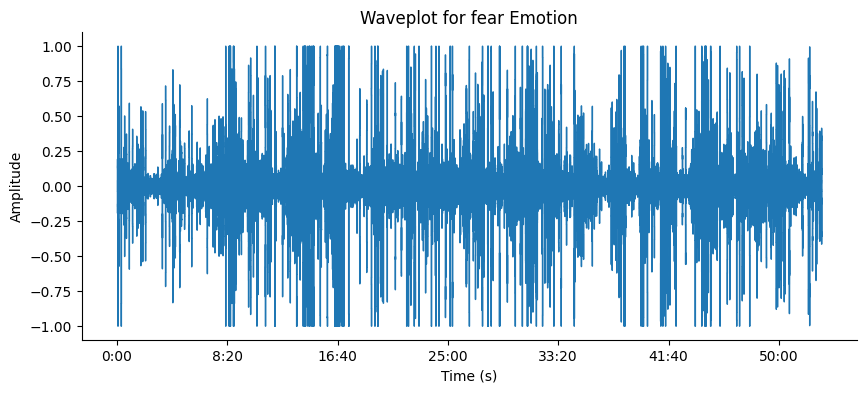

In [ ]:
# Función para generar Waveplot de una emoción
def plot_waveplot_for_emotion(data, sr, emotion):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(data, sr=sr)
    plt.title(f'Waveplot for {emotion} Emotion')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.gca().spines[['top', 'right']].set_visible(False)
    plt.show()

# Función para leer todos los archivos de una emoción y generar Waveplot
def process_emotion_waveplot(emotion, emotion_files):
    combined_audio = np.array([])  # Array para combinar todos los archivos de una emoción
    sr = None  # Inicializar la variable para el sample rate

    # Iterar sobre cada archivo de la emoción y cargar el audio
    for file_path in emotion_files:
        try:
            audio_data, sr = librosa.load(file_path, sr=None)
            combined_audio = np.concatenate((combined_audio, audio_data))  # Concatenar audios
        except Exception as e:
            print(f"Error al cargar el archivo {file_path}: {e}")

    # Generar Waveplot de la emoción
    if len(combined_audio) > 0:
        plot_waveplot_for_emotion(combined_audio, sr, emotion)
    else:
        print(f"No se pudo generar visualizaciones para {emotion} por falta de audio.")

# Agrupar los archivos por emoción y generar Waveplot
emotions = emotion_df['Emocion'].unique()

for emotion in emotions:
    # Obtener todos los archivos asociados a la emoción
    emotion_files = emotion_df[emotion_df['Emocion'] == emotion]['Path'].tolist()

    print(f"Procesando {len(emotion_files)} archivos para la emoción: {emotion}")

    # Procesar los archivos de esta emoción para Waveplot
    process_emotion_waveplot(emotion, emotion_files)


In [ ]:
# Filtrar registros válidos para evitar problemas al graficar
valid_emotion_df = emotion_df.dropna(subset=['Frecuencia Fundamental (Hz)'])

# Crear gráfico de violín para la Frecuencia Fundamental por Emoción
fig = px.violin(
    valid_emotion_df,
    y="Frecuencia Fundamental (Hz)",  # Eje Y
    x="Emocion",                      # Eje X
    color="Emocion",                 # Colores por emoción
    box=True,                        # Añadir boxplot
    points="all",                    # Mostrar todos los puntos
    title="Diagrama de Violín de Frecuencia Fundamental por Emoción"
)

# Mostrar el gráfico
fig.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



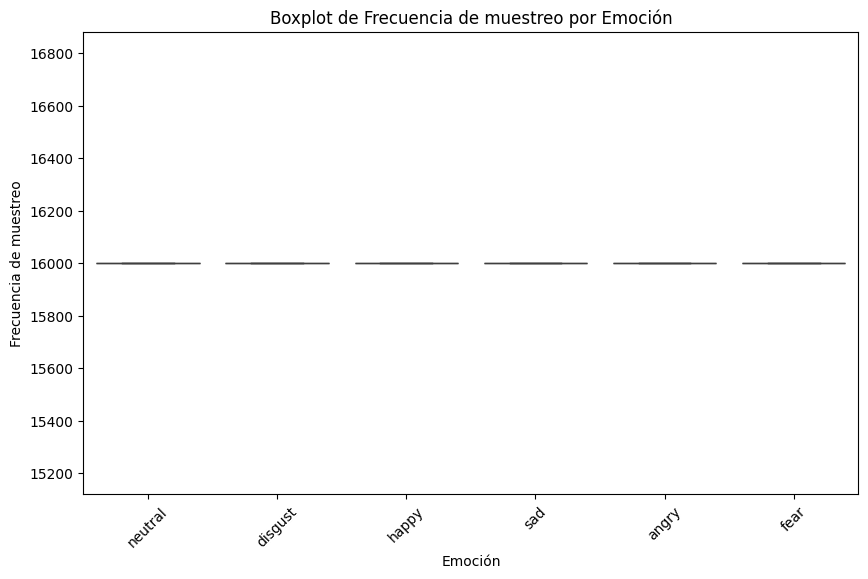

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

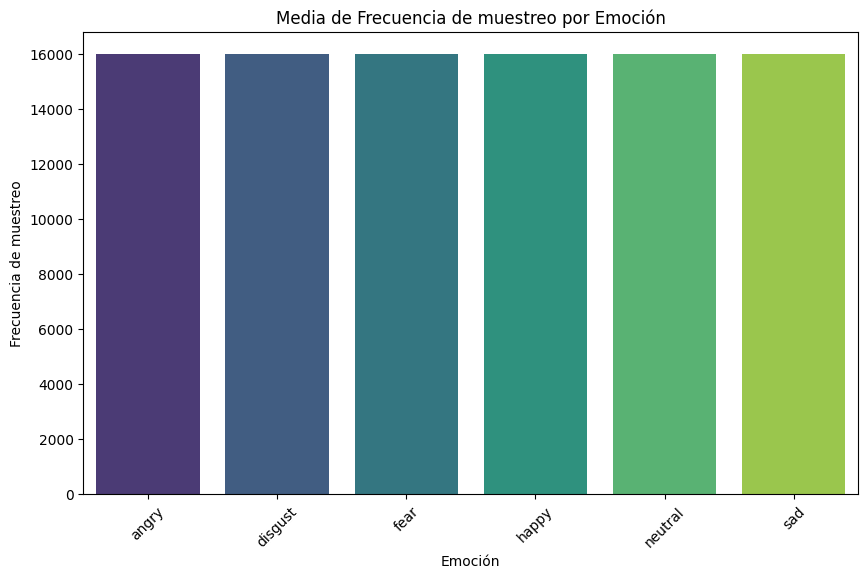

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



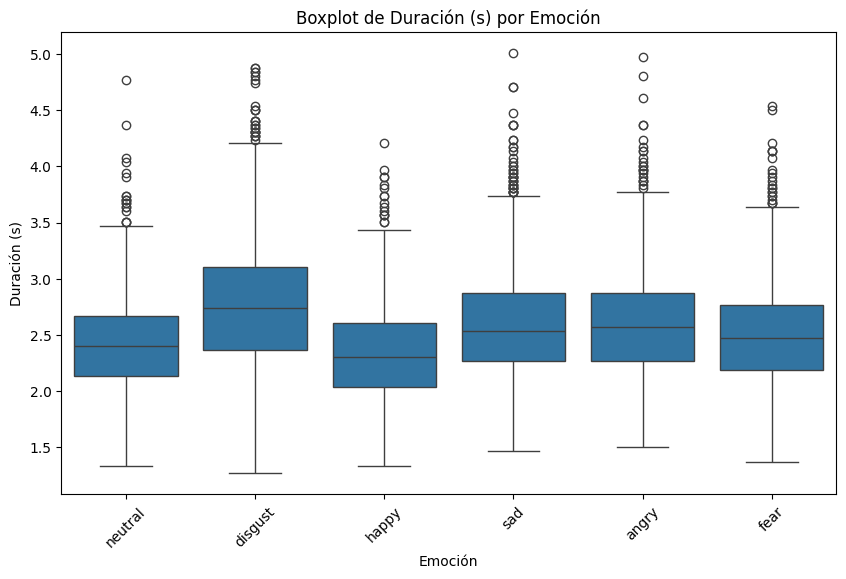

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

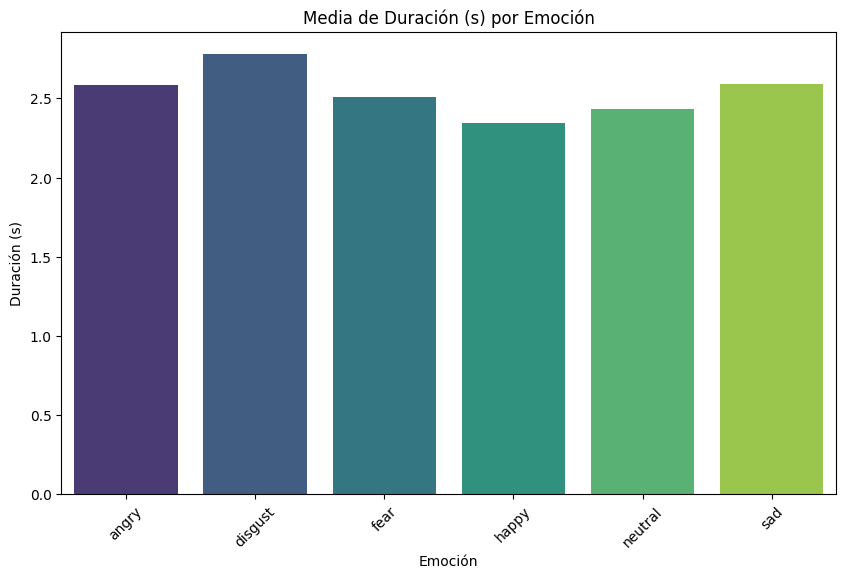

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



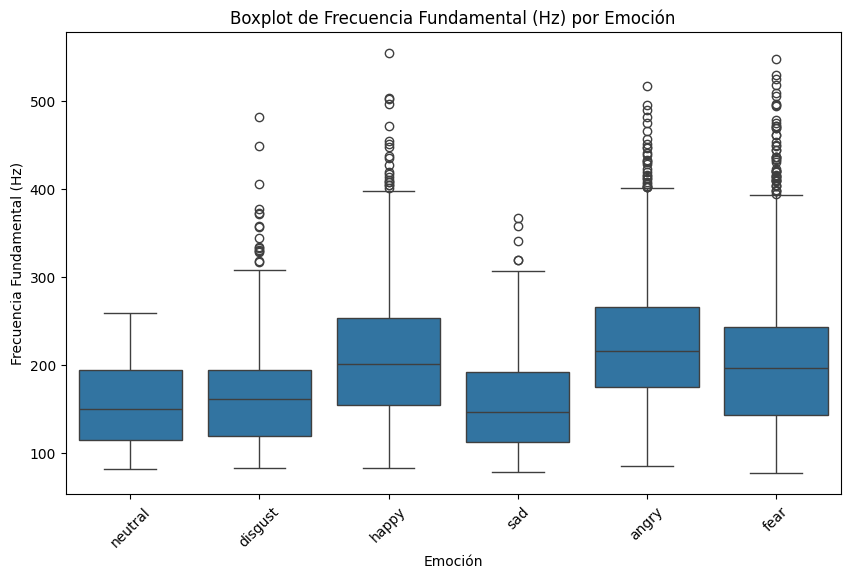

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

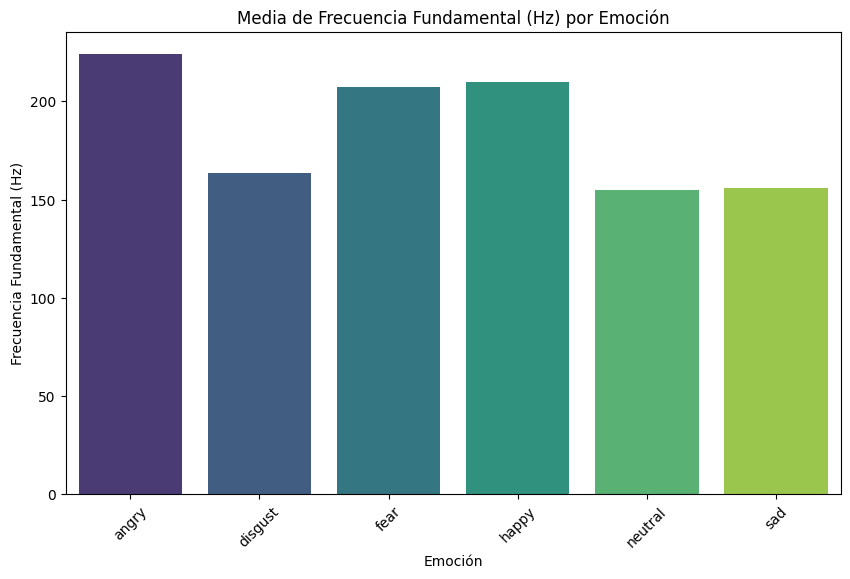

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



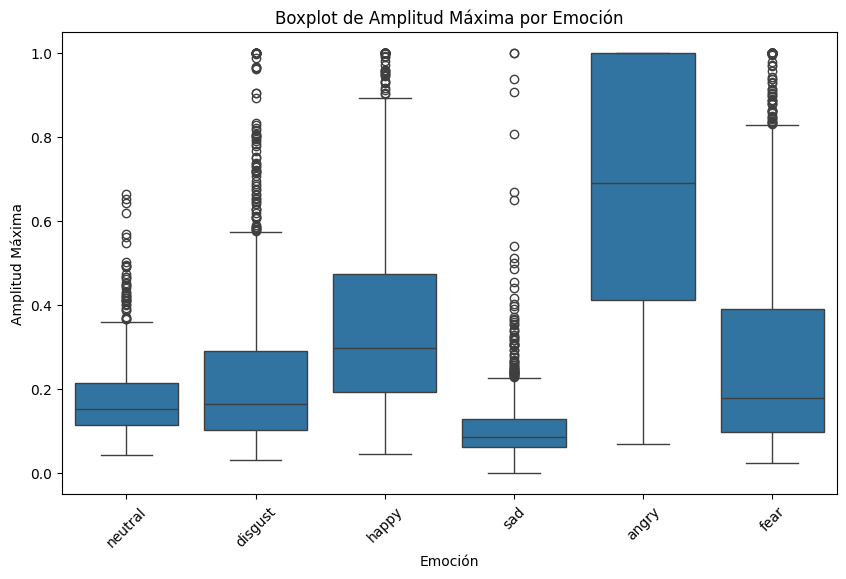

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

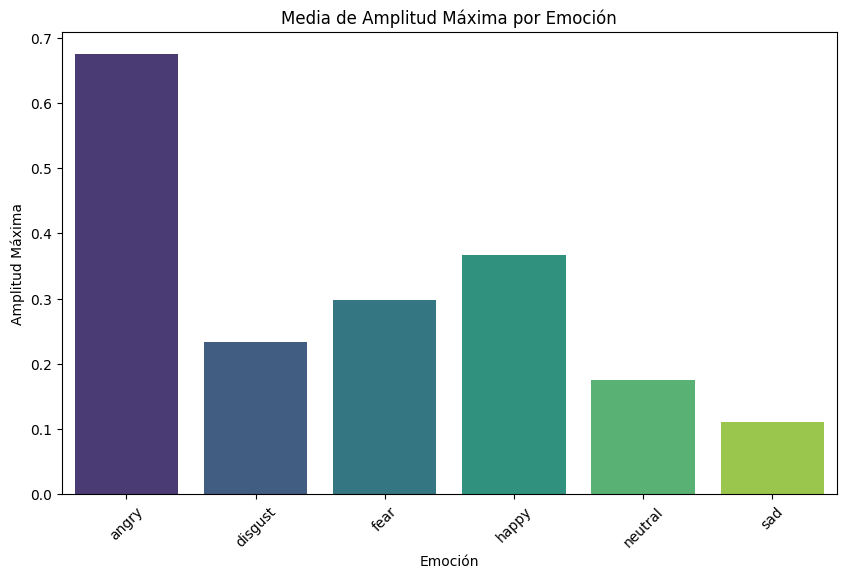

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



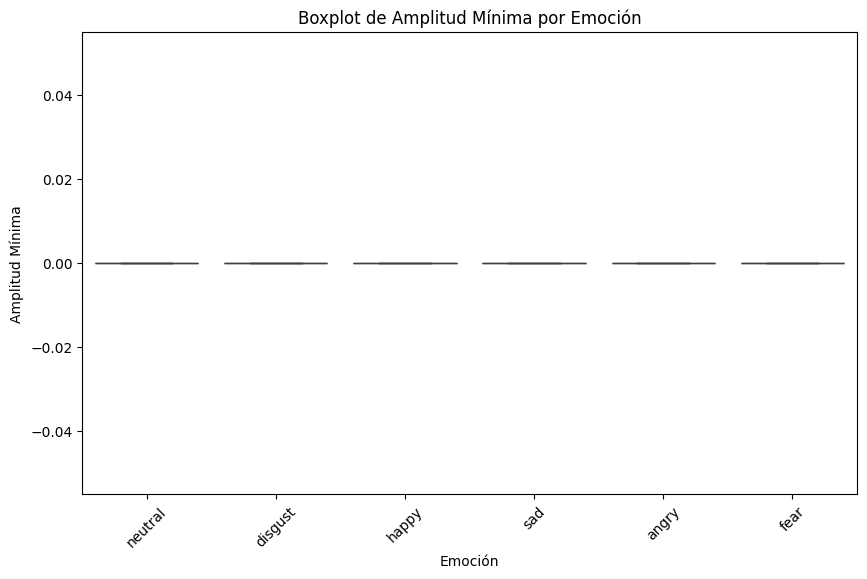

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

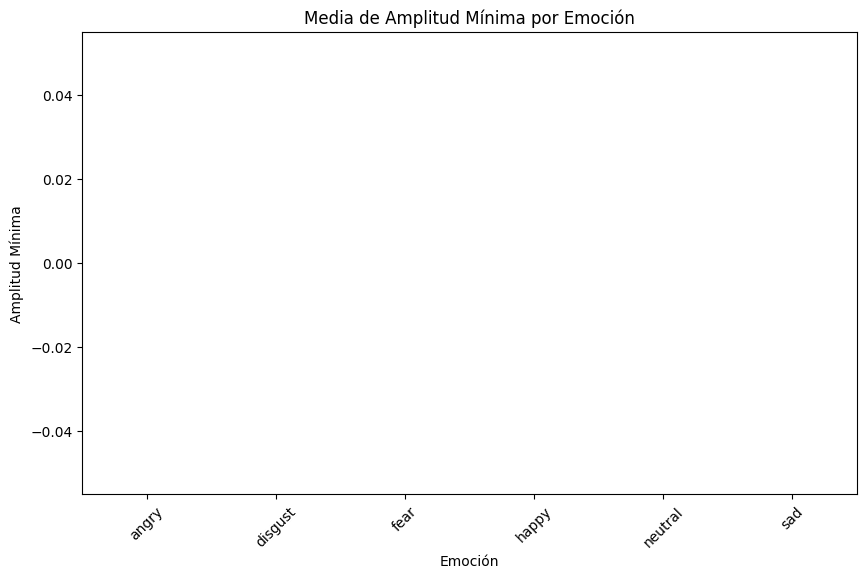

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



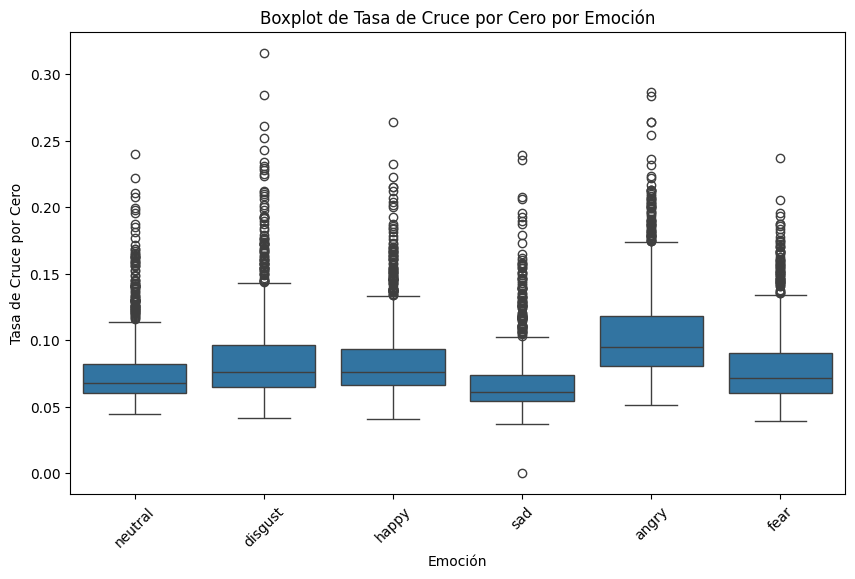

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

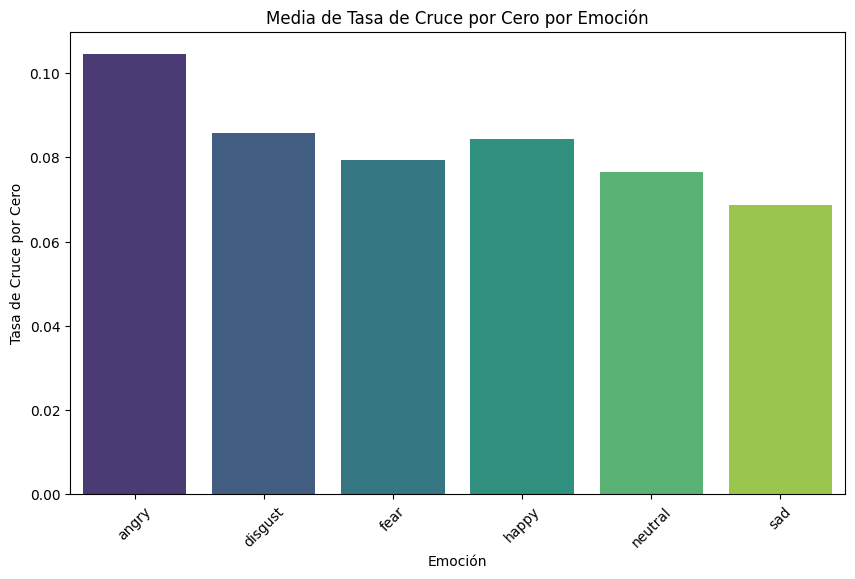

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



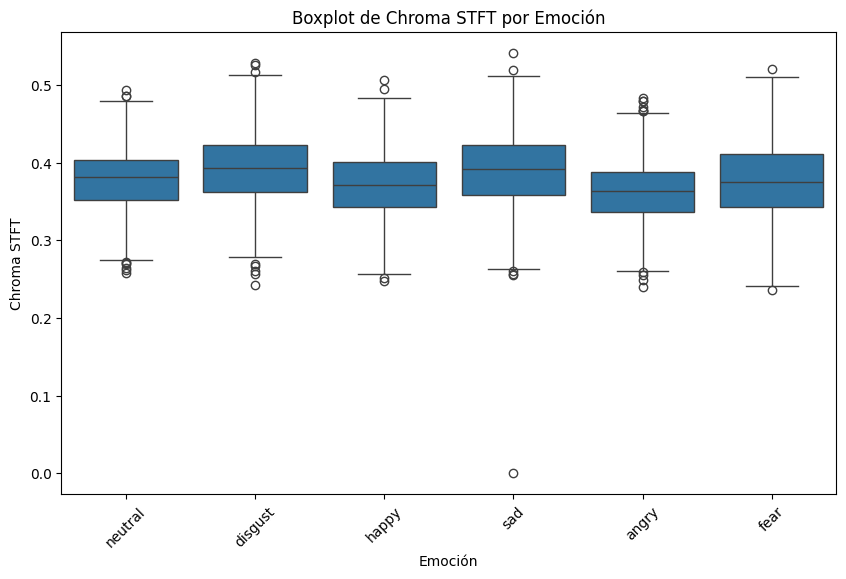

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

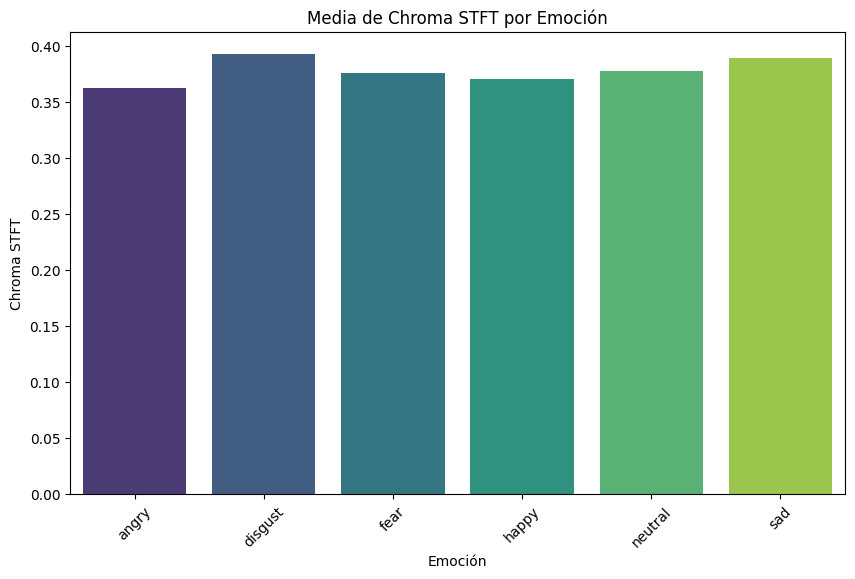

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



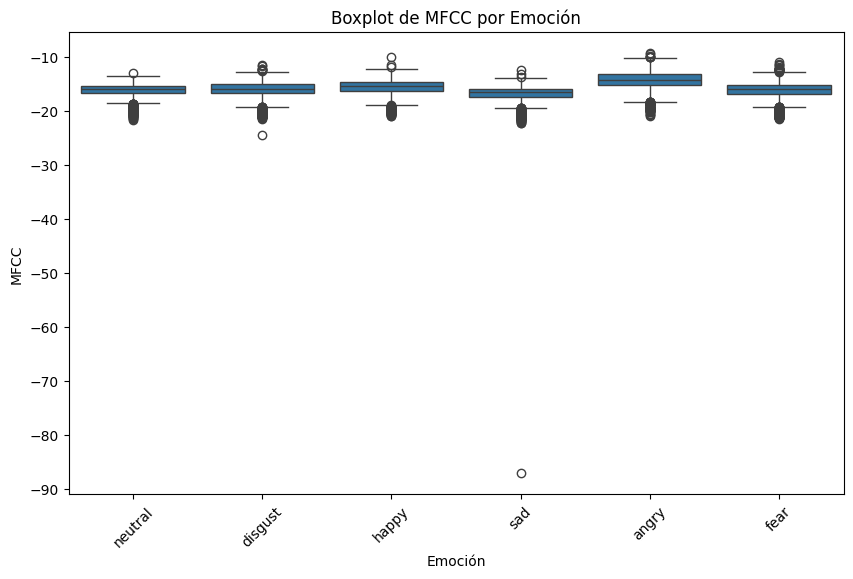

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

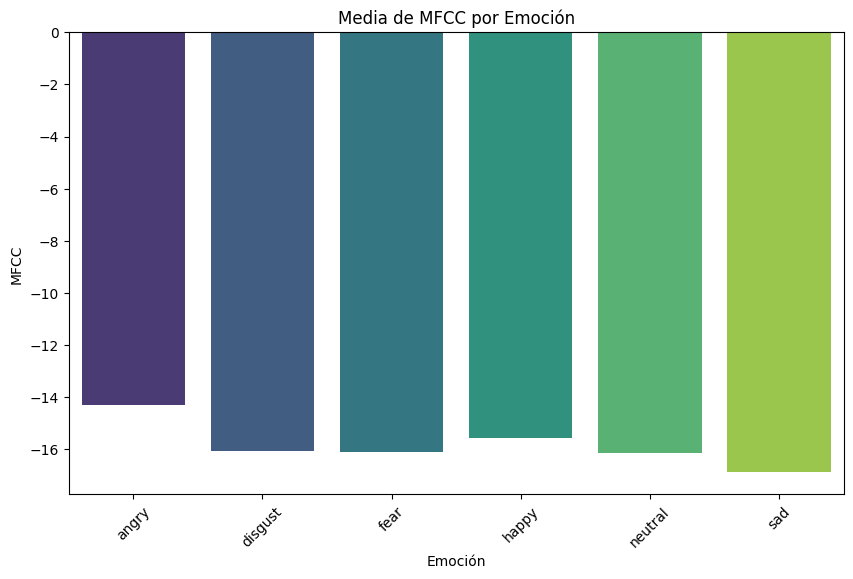

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



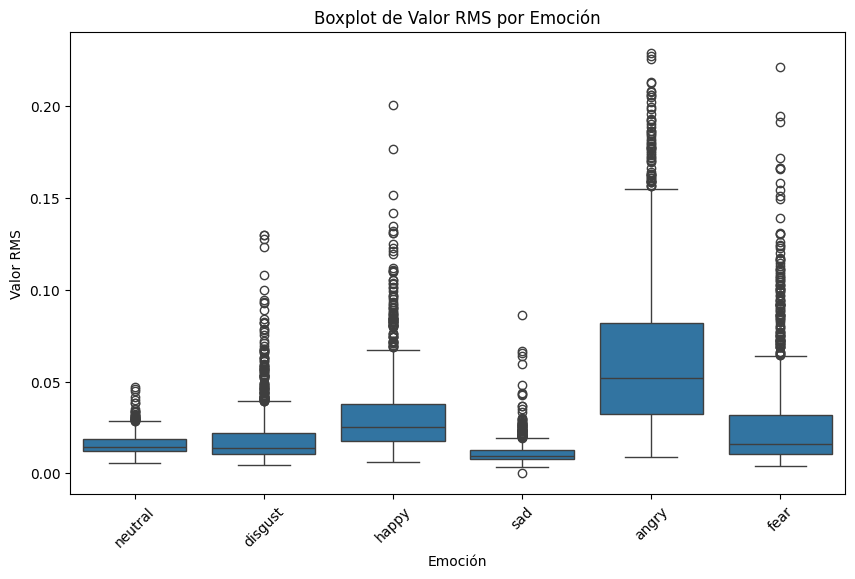

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

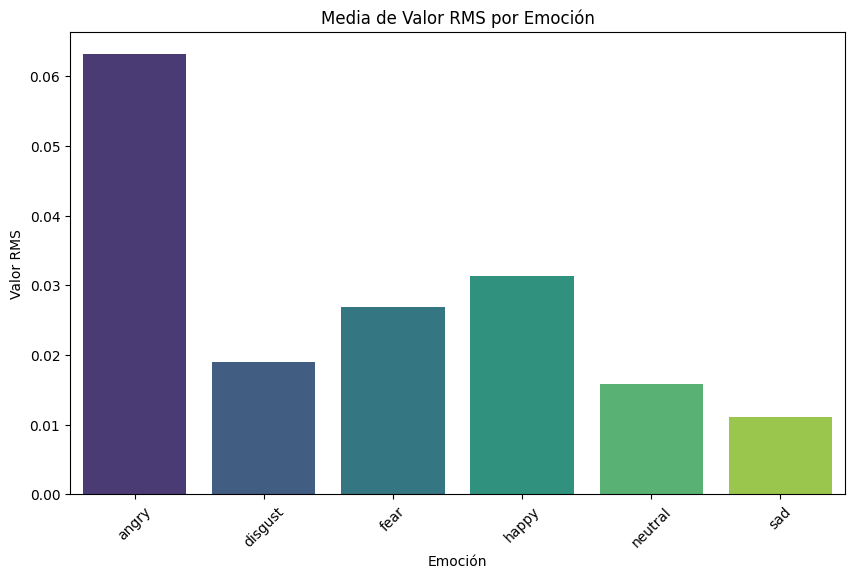

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



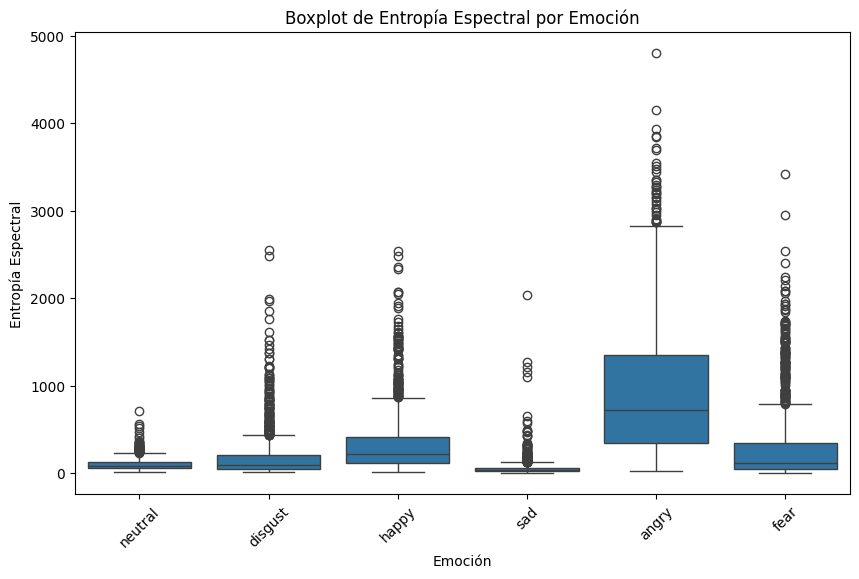

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

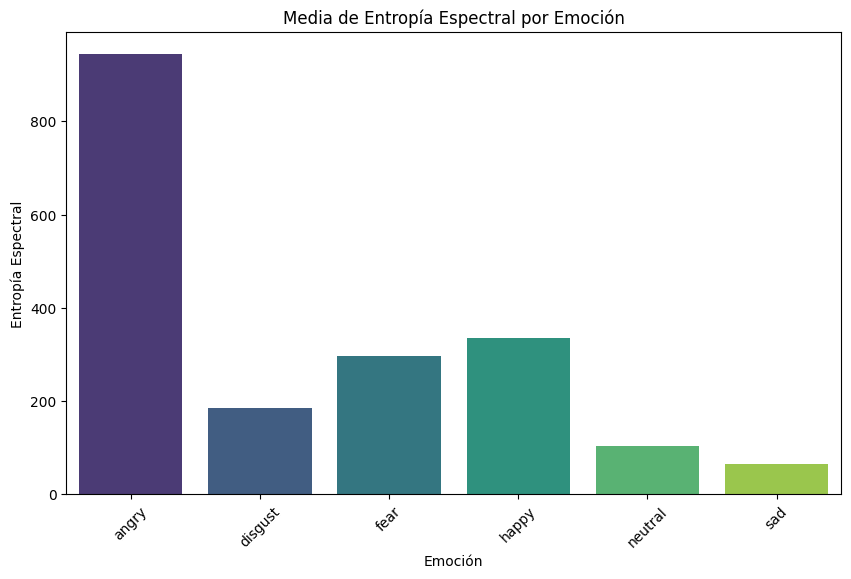

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



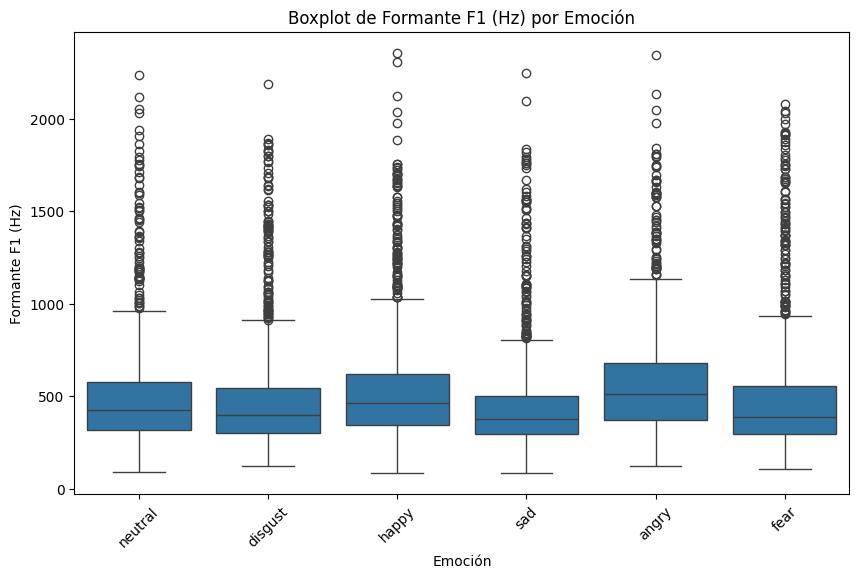

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

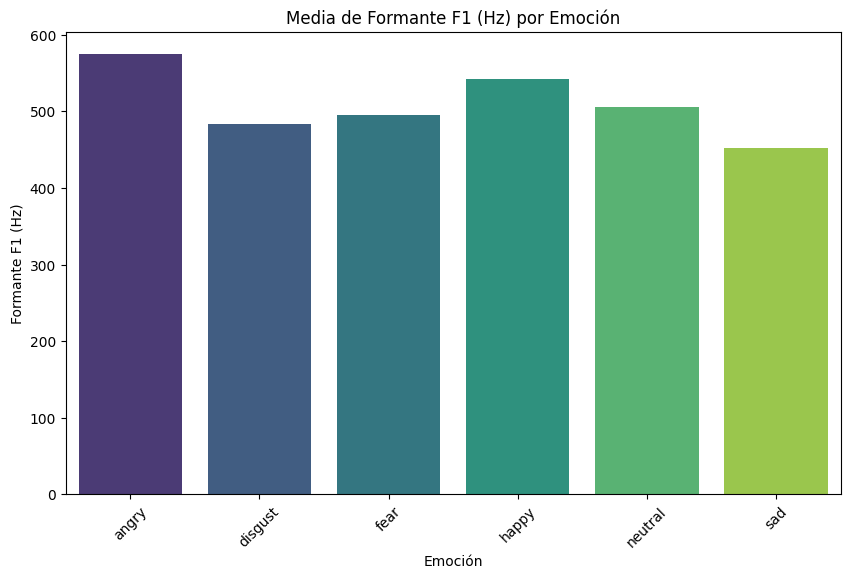

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



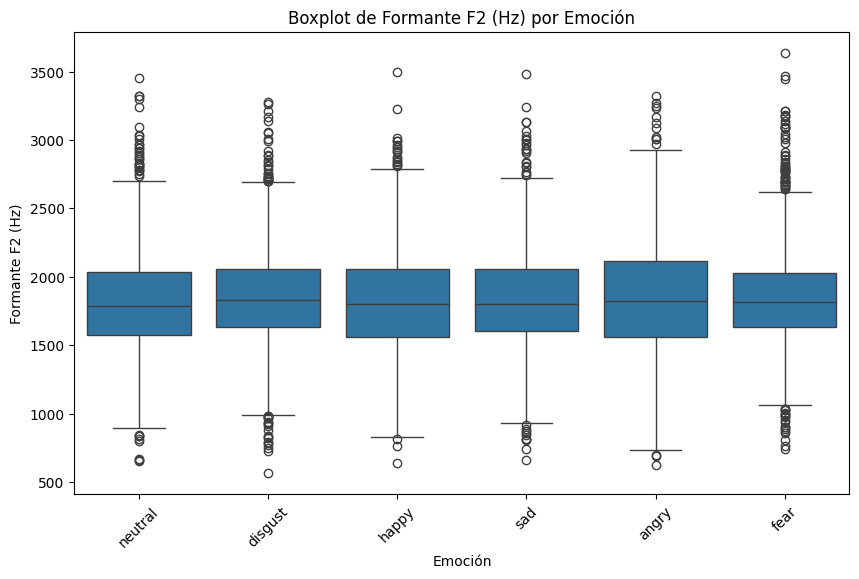

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

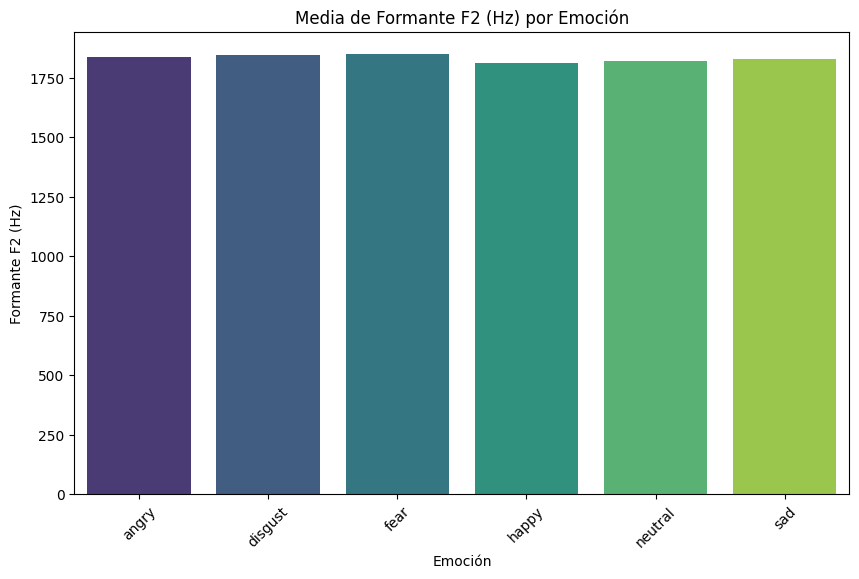

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



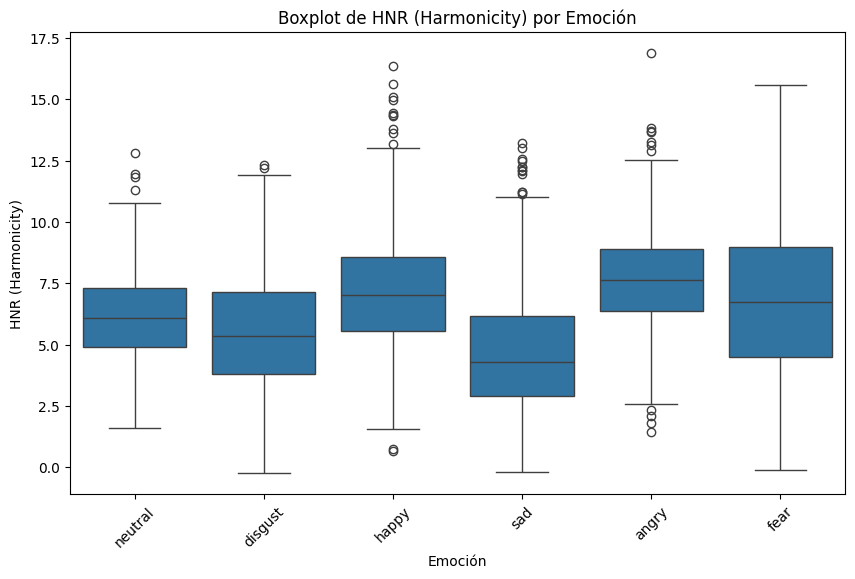

<ipython-input-15-f25069e1252d>:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

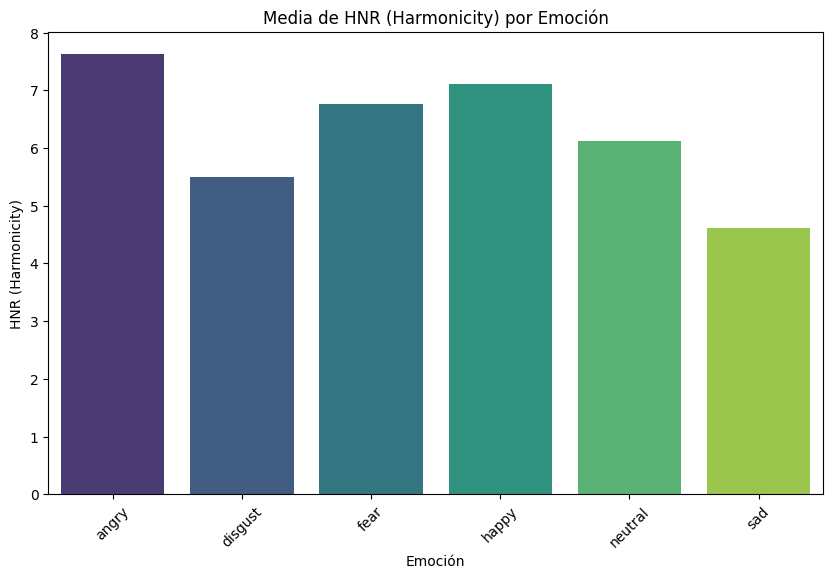

In [ ]:
# Lista de características para graficar
columns_to_plot = [
    'Frecuencia de muestreo',
    'Duración (s)',
    'Frecuencia Fundamental (Hz)',
    'Amplitud Máxima',
    'Amplitud Mínima',
    'Tasa de Cruce por Cero',
    'Chroma STFT',
    'MFCC',
    'Valor RMS',
    'Entropía Espectral',
    'Formante F1 (Hz)',
    'Formante F2 (Hz)',
    'HNR (Harmonicity)'
]

# Función para convertir listas de características en valores numéricos promedio
def convert_to_mean(column):
    if isinstance(column, str):
        try:
            # Convertir la cadena de texto a una lista de números
            arr = np.fromstring(column.strip("[]"), sep=' ')
            return np.mean(arr)
        except Exception as e:
            print(f"Error al convertir {column}: {e}")
            return np.nan
    return column  # Si no es una cadena, devolver el valor original

# Iterar sobre cada columna y generar gráficos
for column in columns_to_plot:
    if column in emotion_df.columns:
        # Procesar columnas con listas para calcular la media
        if column in ['Chroma STFT', 'MFCC']:
            emotion_df[column] = emotion_df[column].apply(convert_to_mean)

        # Filtrar registros válidos
        valid_emotion_df = emotion_df.dropna(subset=[column])

        # Gráfico de violín
        fig = px.violin(
            valid_emotion_df,
            y=column,
            x='Emocion',
            color='Emocion',
            box=True,
            points='all',
            title=f'Diagrama de Violín de {column} por Emoción'
        )
        fig.show()

        # Gráfico de boxplot
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='Emocion', y=column, data=valid_emotion_df)
        plt.title(f'Boxplot de {column} por Emoción')
        plt.xlabel('Emoción')
        plt.ylabel(column)
        plt.xticks(rotation=45)
        plt.show()

        # Gráfico de barras para la media
        mean_values = valid_emotion_df.groupby('Emocion')[column].mean().reset_index()
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Emocion', y=column, data=mean_values, palette='viridis')
        plt.title(f'Media de {column} por Emoción')
        plt.xlabel('Emoción')
        plt.ylabel(column)
        plt.xticks(rotation=45)
        plt.show()


        #Desplazar porque hay varias graficas

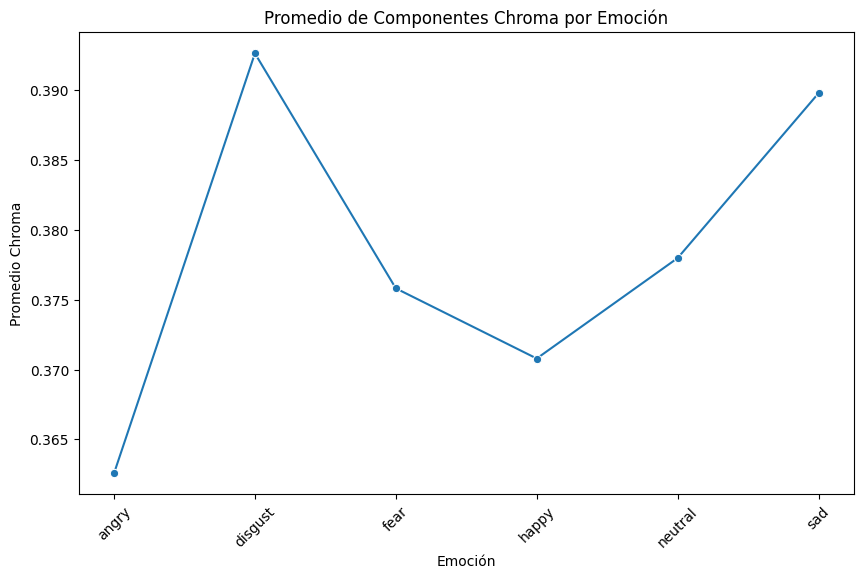

In [ ]:
# Calcular el promedio de los componentes Chroma por emoción
chroma_avg = emotion_df.copy()
chroma_avg['Chroma STFT'] = chroma_avg['Chroma STFT'].apply(lambda x: np.mean(np.fromstring(x.strip("[]"), sep=' ')) if isinstance(x, str) else x)
chroma_avg = chroma_avg.groupby('Emocion')['Chroma STFT'].mean().reset_index()

# Crear el gráfico de líneas
plt.figure(figsize=(10, 6))
sns.lineplot(data=chroma_avg, x='Emocion', y='Chroma STFT', marker='o')
plt.title('Promedio de Componentes Chroma por Emoción')
plt.xlabel('Emoción')
plt.ylabel('Promedio Chroma')
plt.xticks(rotation=45)
plt.show()


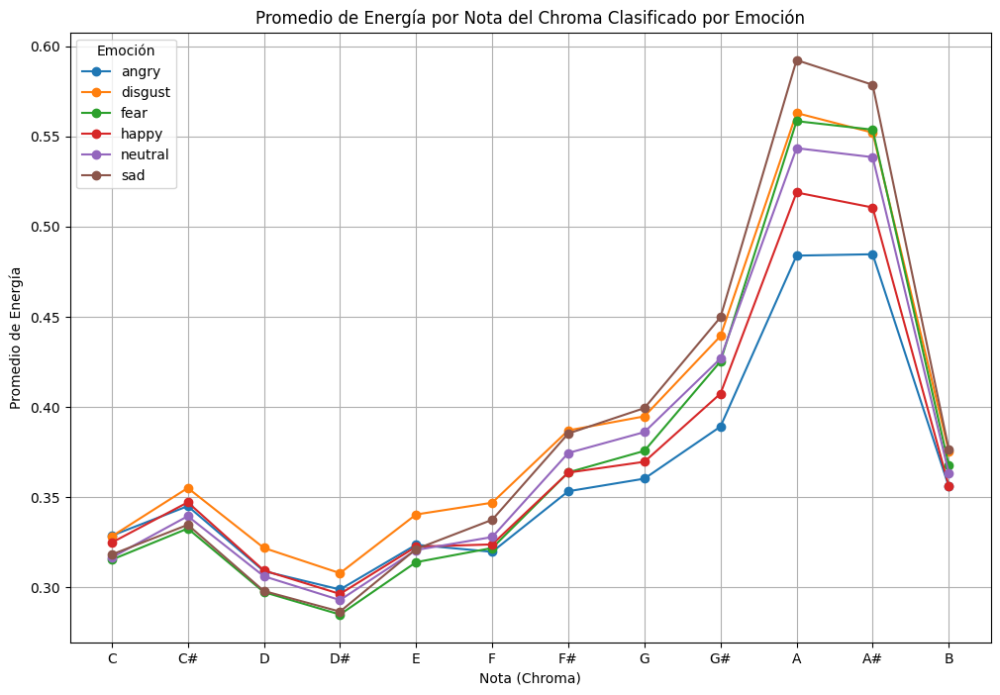

In [ ]:
# Crear una copia del DataFrame para trabajar con Chroma STFT
chroma_df = emotion_df.copy()

# Función para convertir la columna Chroma STFT (almacenada como cadenas) en arrays numéricos y calcular el promedio
def chroma_avg_per_emotion(column):
    if isinstance(column, str):
        try:
            # Convertir la cadena a un array de números
            arr = np.fromstring(column.strip("[]"), sep=' ')
            return arr  # Devolver el array de energía por cada nota
        except Exception as e:
            print(f"Error al convertir {column}: {e}")
            return np.nan
    return np.nan

# Aplicar la función para convertir los valores de la columna 'Chroma STFT' en arrays de energía
chroma_df['Chroma STFT'] = chroma_df['Chroma STFT'].apply(chroma_avg_per_emotion)

# Listar las notas del Chroma STFT (do, do#, re, etc.)
notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']

# Calcular el promedio de energía por nota para cada emoción
chroma_avg_by_emotion = chroma_df.groupby('Emocion')['Chroma STFT'].apply(lambda x: np.mean(np.vstack(x), axis=0)).reset_index()

# Crear el gráfico de líneas
plt.figure(figsize=(12, 8))

# Graficar la energía promedio por nota para cada emoción
for i, row in chroma_avg_by_emotion.iterrows():
    plt.plot(notes, row['Chroma STFT'], label=row['Emocion'], marker='o')

# Configurar el título y etiquetas del gráfico
plt.title('Promedio de Energía por Nota del Chroma Clasificado por Emoción')
plt.xlabel('Nota (Chroma)')
plt.ylabel('Promedio de Energía')
plt.legend(title='Emoción')
plt.grid(True)

# Mostrar el gráfico
plt.show()


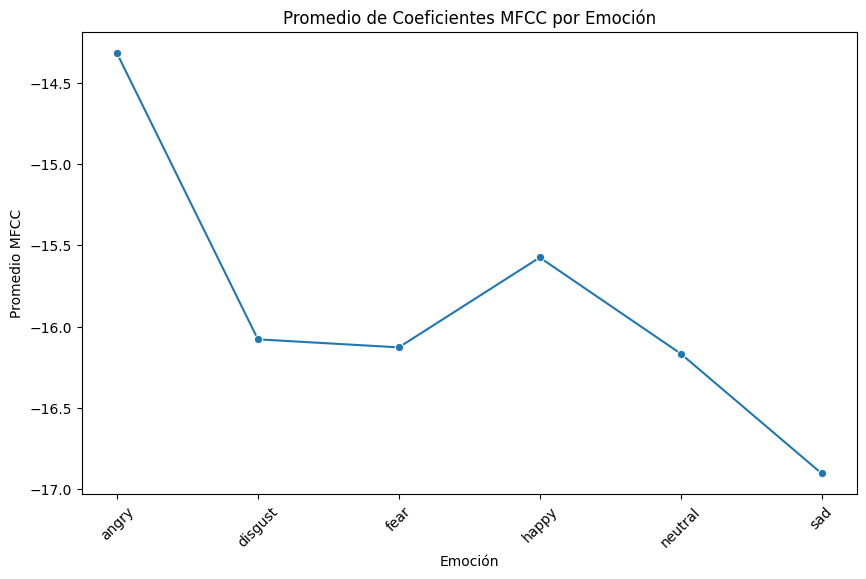

In [ ]:
# Calcular el promedio de los coeficientes MFCC por emoción
mfcc_avg = emotion_df.copy()
mfcc_avg['MFCC'] = mfcc_avg['MFCC'].apply(lambda x: np.mean(np.fromstring(x.strip("[]"), sep=' ')) if isinstance(x, str) else x)
mfcc_avg = mfcc_avg.groupby('Emocion')['MFCC'].mean().reset_index()

# Crear el gráfico de líneas
plt.figure(figsize=(10, 6))
sns.lineplot(data=mfcc_avg, x='Emocion', y='MFCC', marker='o')
plt.title('Promedio de Coeficientes MFCC por Emoción')
plt.xlabel('Emoción')
plt.ylabel('Promedio MFCC')
plt.xticks(rotation=45)
plt.show()


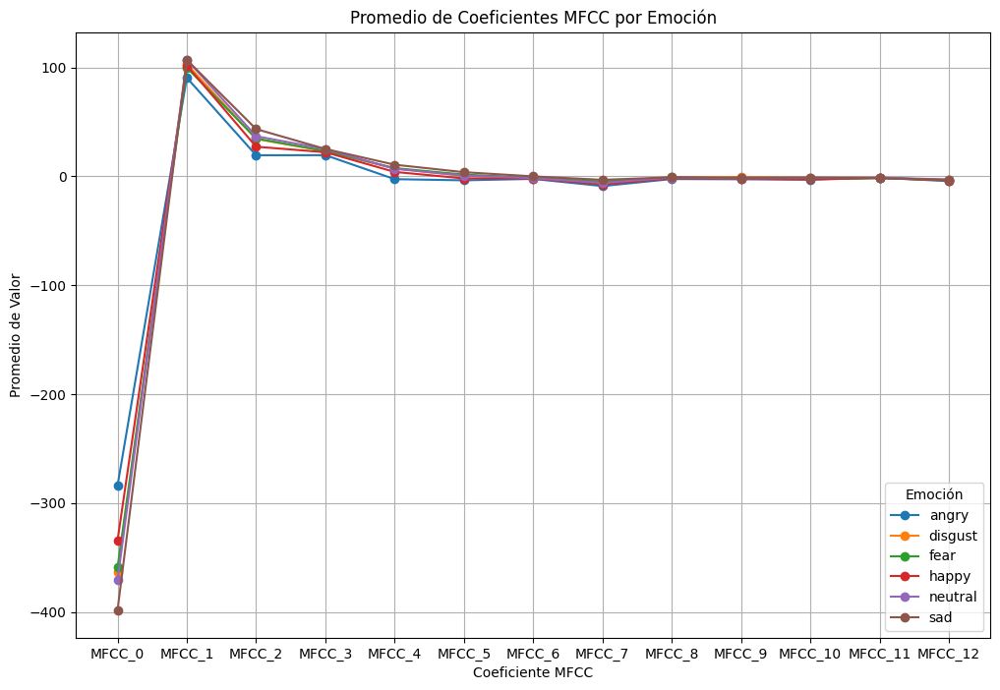

In [ ]:
# Crear una copia del DataFrame para trabajar con MFCC
mfcc_df = emotion_df.copy()

# Función para convertir la columna MFCC (almacenada como cadenas) en arrays numéricos y calcular el promedio
def mfcc_avg_per_emotion(column):
    if isinstance(column, str):
        try:
            # Convertir la cadena a un array de números
            arr = np.fromstring(column.strip("[]"), sep=' ')
            return arr  # Devolver el array de coeficientes MFCC
        except Exception as e:
            print(f"Error al convertir {column}: {e}")
            return np.nan
    return np.nan

# Aplicar la función para convertir los valores de la columna 'MFCC' en arrays de coeficientes
mfcc_df['MFCC'] = mfcc_df['MFCC'].apply(mfcc_avg_per_emotion)

# Calcular el promedio de cada coeficiente MFCC para cada emoción
mfcc_avg_by_emotion = mfcc_df.groupby('Emocion')['MFCC'].apply(lambda x: np.mean(np.vstack(x), axis=0)).reset_index()

# Crear el gráfico de líneas
plt.figure(figsize=(12, 8))

# Graficar el promedio de coeficientes MFCC para cada emoción
for i, row in mfcc_avg_by_emotion.iterrows():
    plt.plot(range(len(row['MFCC'])), row['MFCC'], label=row['Emocion'], marker='o')

# Configurar el título y etiquetas del gráfico
plt.title('Promedio de Coeficientes MFCC por Emoción')
plt.xlabel('Coeficiente MFCC')
plt.ylabel('Promedio de Valor')
plt.xticks(ticks=range(len(row['MFCC'])), labels=[f'MFCC_{i}' for i in range(len(row['MFCC']))])  # Etiquetas MFCC_0, MFCC_1, etc.
plt.legend(title='Emoción')
plt.grid(True)

# Mostrar el gráfico
plt.show()



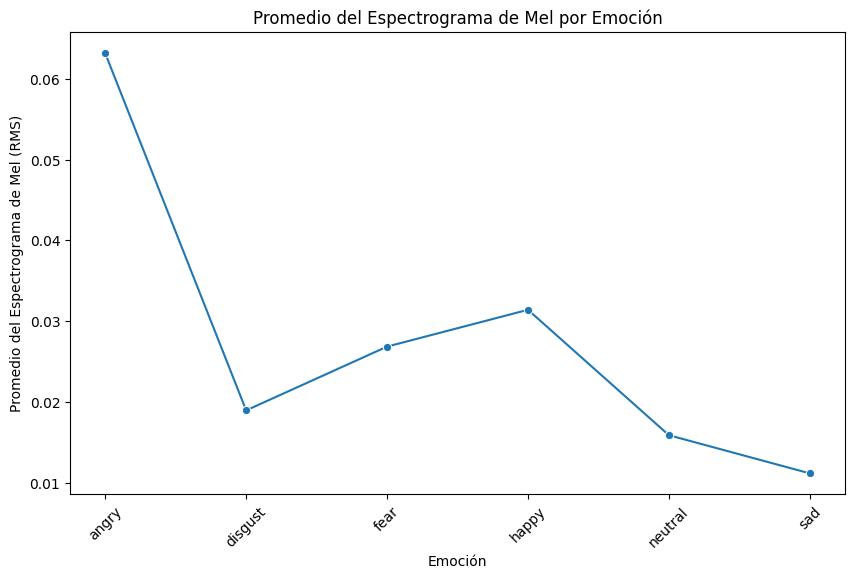

In [ ]:
# Calcular el promedio del espectrograma de Mel por emoción
mel_avg = emotion_df.copy()
mel_avg['Valor RMS'] = mel_avg['Valor RMS']  # Asegúrate de que esta columna es adecuada para el cálculo
mel_avg = mel_avg.groupby('Emocion')['Valor RMS'].mean().reset_index()

# Crear el gráfico de líneas
plt.figure(figsize=(10, 6))
sns.lineplot(data=mel_avg, x='Emocion', y='Valor RMS', marker='o')
plt.title('Promedio del Espectrograma de Mel por Emoción')
plt.xlabel('Emoción')
plt.ylabel('Promedio del Espectrograma de Mel (RMS)')
plt.xticks(rotation=45)
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` 

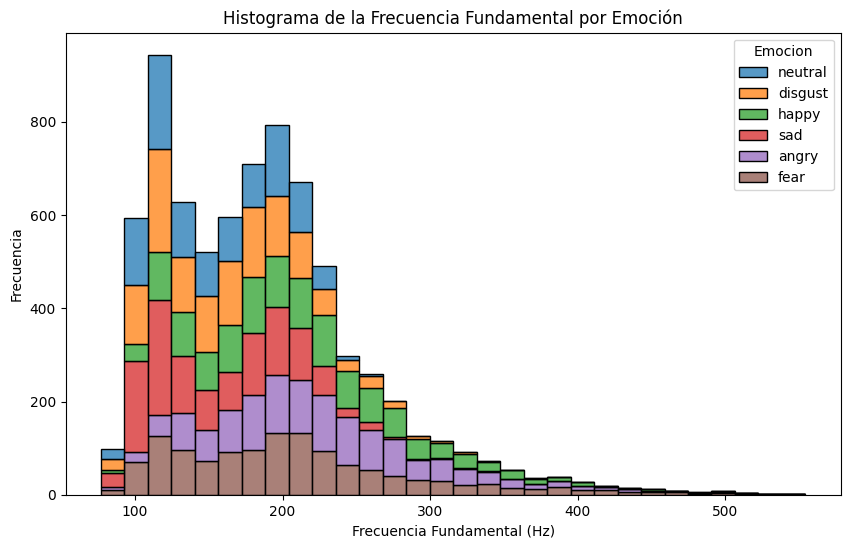

In [ ]:
# Crear un histograma de la Frecuencia Fundamental por emoción
plt.figure(figsize=(10, 6))
sns.histplot(data=valid_emotion_df, x='Frecuencia Fundamental (Hz)', hue='Emocion', multiple="stack", bins=30)
plt.title('Histograma de la Frecuencia Fundamental por Emoción')
plt.xlabel('Frecuencia Fundamental (Hz)')
plt.ylabel('Frecuencia')
plt.show()


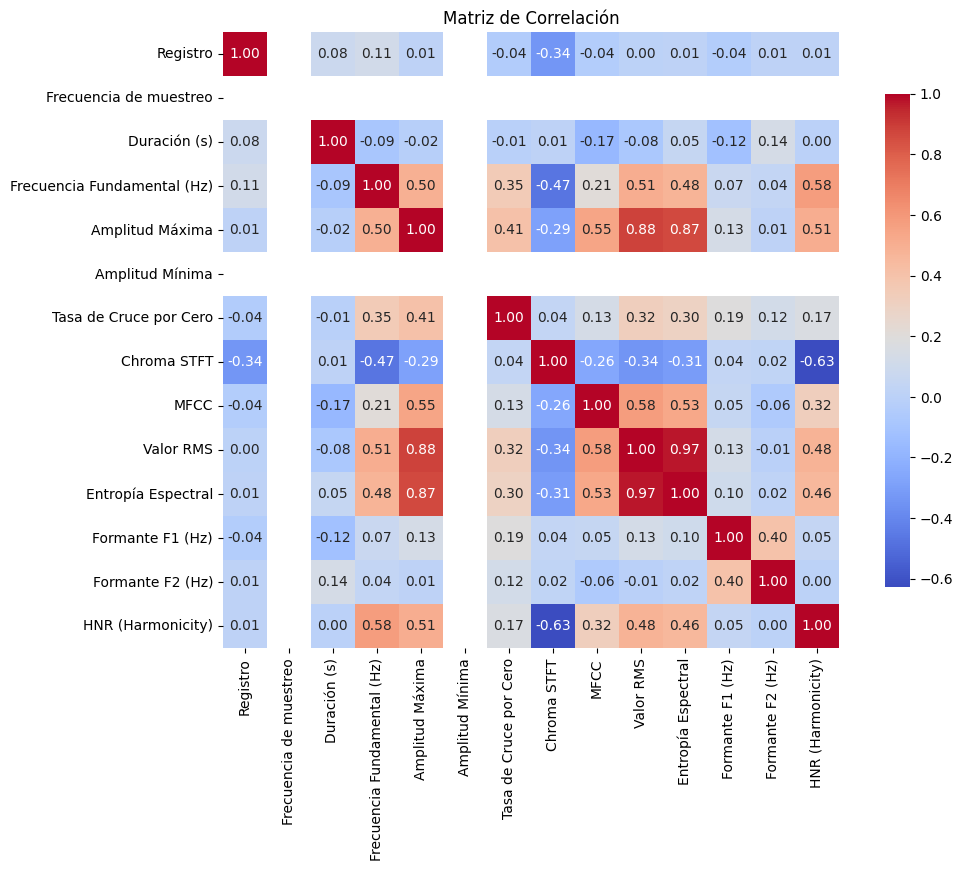

In [ ]:
# Filtrar solo las columnas numéricas
numerical_columns = emotion_df.select_dtypes(include=[np.number])

# Calcular la matriz de correlación
correlation_matrix = numerical_columns.corr()

# Crear un mapa de calor para la correlación
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Matriz de Correlación')
plt.show()


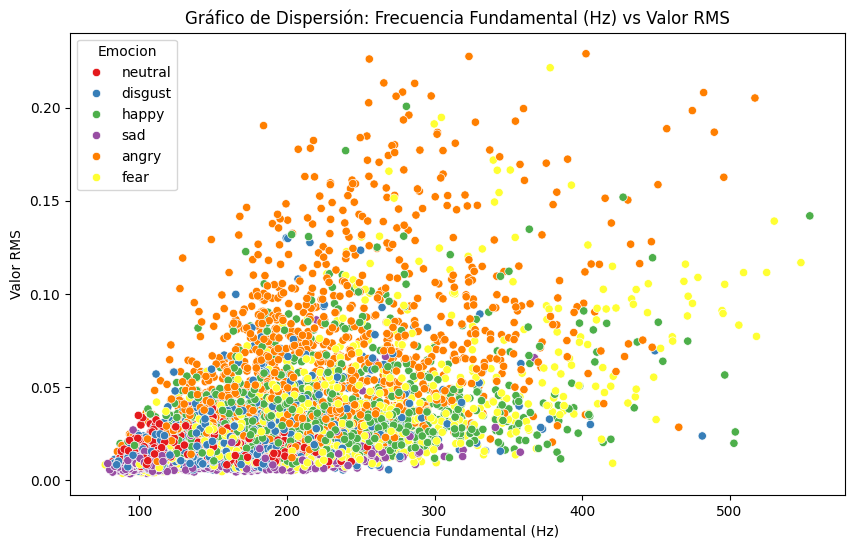

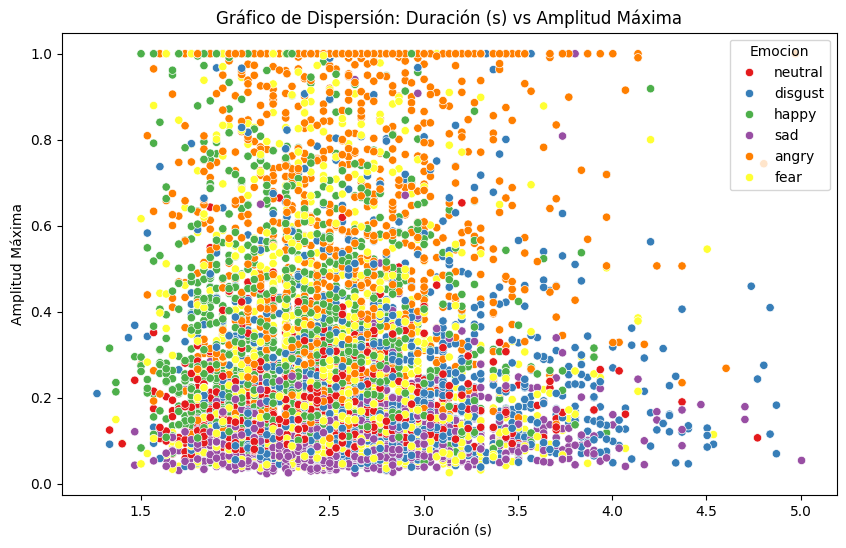

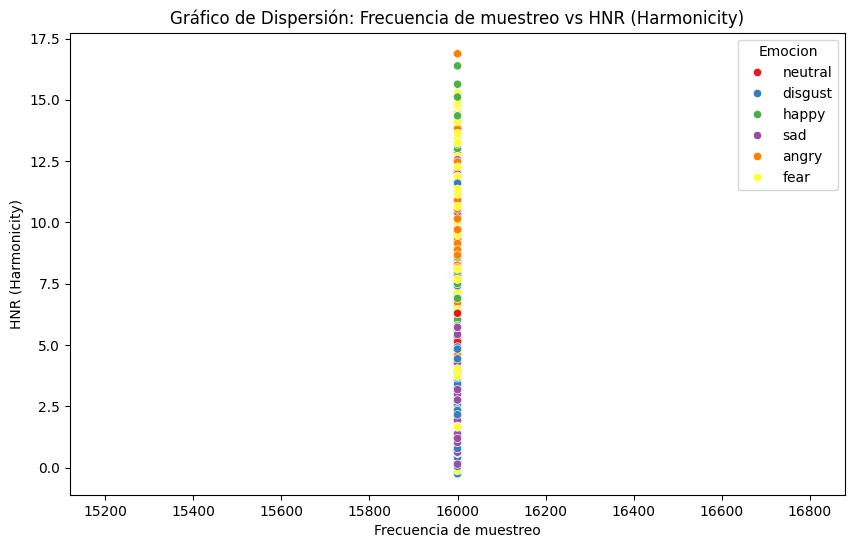

In [ ]:
# Gráficos de dispersión para pares de características
pairs_to_plot = [
    ('Frecuencia Fundamental (Hz)', 'Valor RMS'),
    ('Duración (s)', 'Amplitud Máxima'),
    ('Frecuencia de muestreo', 'HNR (Harmonicity)')
]

for x_col, y_col in pairs_to_plot:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=valid_emotion_df, x=x_col, y=y_col, hue='Emocion', palette='Set1')
    plt.title(f'Gráfico de Dispersión: {x_col} vs {y_col}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.show()


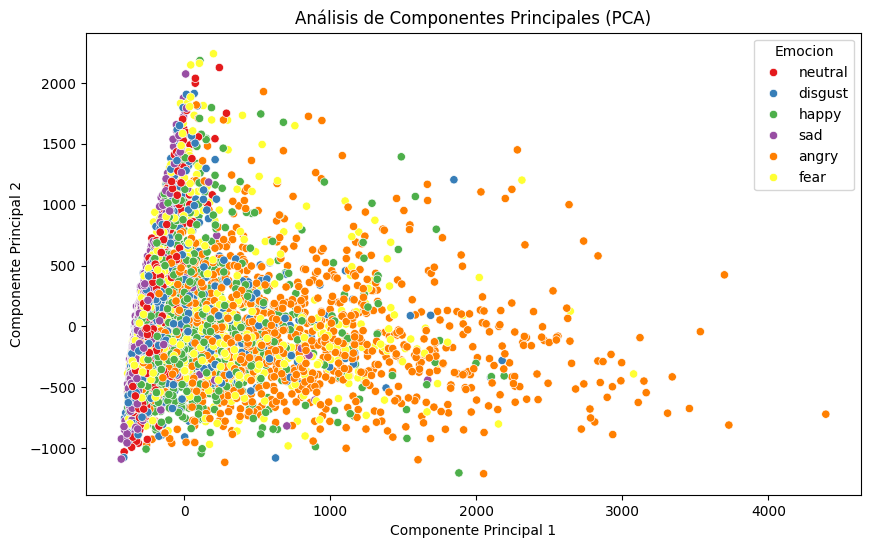

In [ ]:
from sklearn.decomposition import PCA

# Seleccionar solo las características numéricas
features = valid_emotion_df[columns_to_plot].dropna()

# Aplicar PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

# Crear un DataFrame para los resultados de PCA
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Emocion'] = valid_emotion_df['Emocion'].dropna().reset_index(drop=True)

# Gráfico de dispersión de PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue='Emocion', palette='Set1')
plt.title('Análisis de Componentes Principales (PCA)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` 

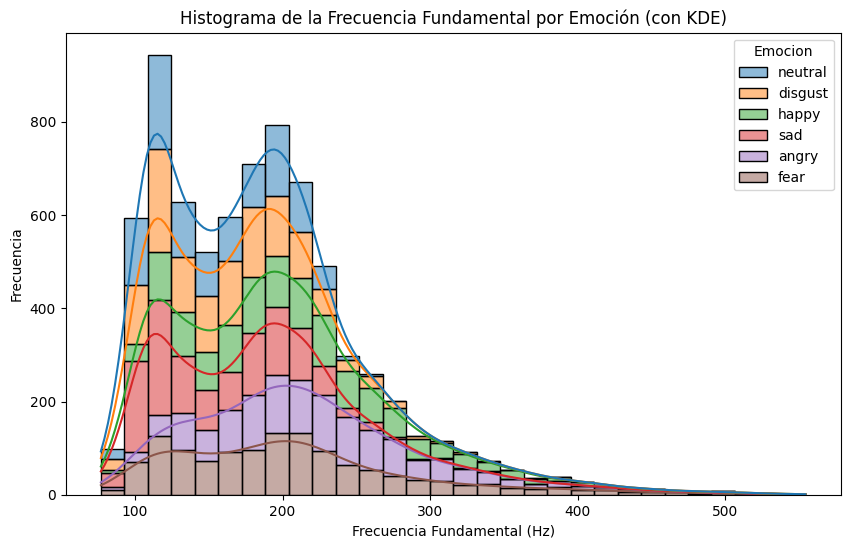

In [ ]:
# Histogramas con KDE
plt.figure(figsize=(10, 6))
sns.histplot(data=valid_emotion_df, x='Frecuencia Fundamental (Hz)', hue='Emocion', multiple='stack', bins=30, kde=True)
plt.title('Histograma de la Frecuencia Fundamental por Emoción (con KDE)')
plt.xlabel('Frecuencia Fundamental (Hz)')
plt.ylabel('Frecuencia')
plt.show()


In [ ]:
# Dimensiones del DataFrame
print("Dimensiones del DataFrame:", emotion_df.shape)

# Información sobre los tipos de datos y valores nulos
print(emotion_df.info())

# Resumen estadístico de las características numéricas
print(emotion_df.describe())


Dimensiones del DataFrame: (7442, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7442 entries, 0 to 7441
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Registro                     7442 non-null   int64  
 1   Emocion                      7442 non-null   object 
 2   Path                         7442 non-null   object 
 3   Frecuencia de muestreo       7442 non-null   int64  
 4   Duración (s)                 7442 non-null   float64
 5   Frecuencia Fundamental (Hz)  7441 non-null   float64
 6   Amplitud Máxima              7442 non-null   float64
 7   Amplitud Mínima              7442 non-null   float64
 8   Tasa de Cruce por Cero       7442 non-null   float64
 9   Chroma STFT                  7442 non-null   float64
 10  MFCC                         7442 non-null   float64
 11  Valor RMS                    7442 non-null   float64
 12  Entropía Espectral           7442 non-

<ipython-input-24-34eeea36db8c>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning

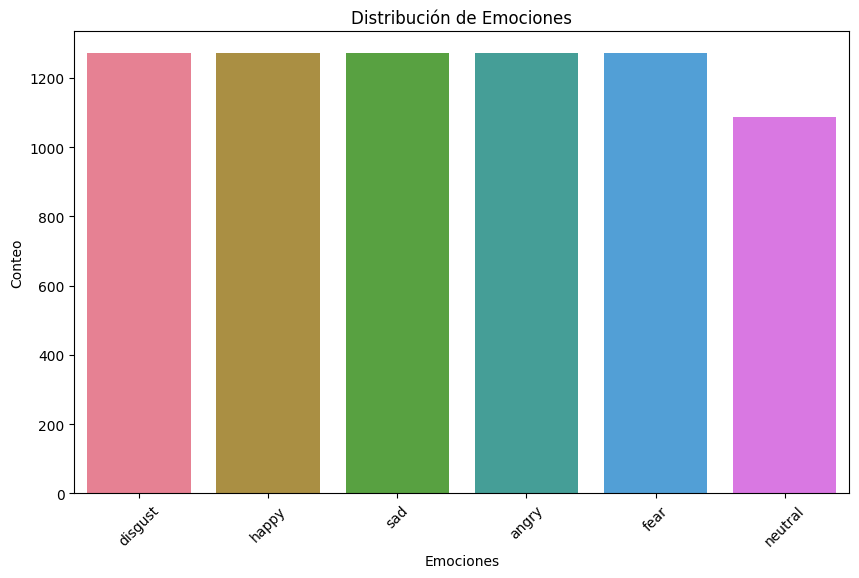

In [ ]:
# Agrupar datos por 'Emocion' y obtener el conteo
emotion_counts = emotion_df['Emocion'].value_counts()

# Definir una paleta de colores
colors = sns.color_palette('husl', len(emotion_counts))

# Crear un gráfico de barras para la distribución de emociones
plt.figure(figsize=(10, 6))
sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette=colors)
plt.title('Distribución de Emociones')
plt.xlabel('Emociones')
plt.ylabel('Conteo')
plt.xticks(rotation=45)
plt.show()


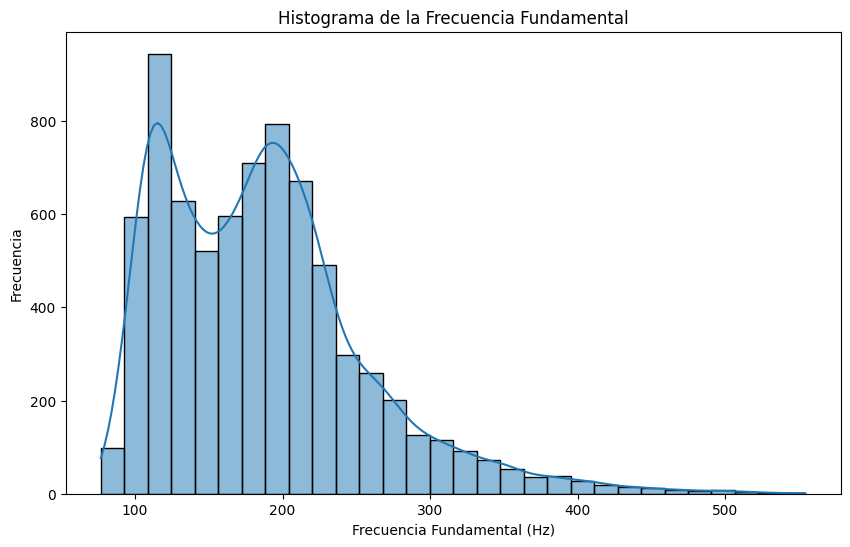

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(emotion_df['Frecuencia Fundamental (Hz)'].dropna(), bins=30, kde=True)
plt.title('Histograma de la Frecuencia Fundamental')
plt.xlabel('Frecuencia Fundamental (Hz)')
plt.ylabel('Frecuencia')
plt.show()


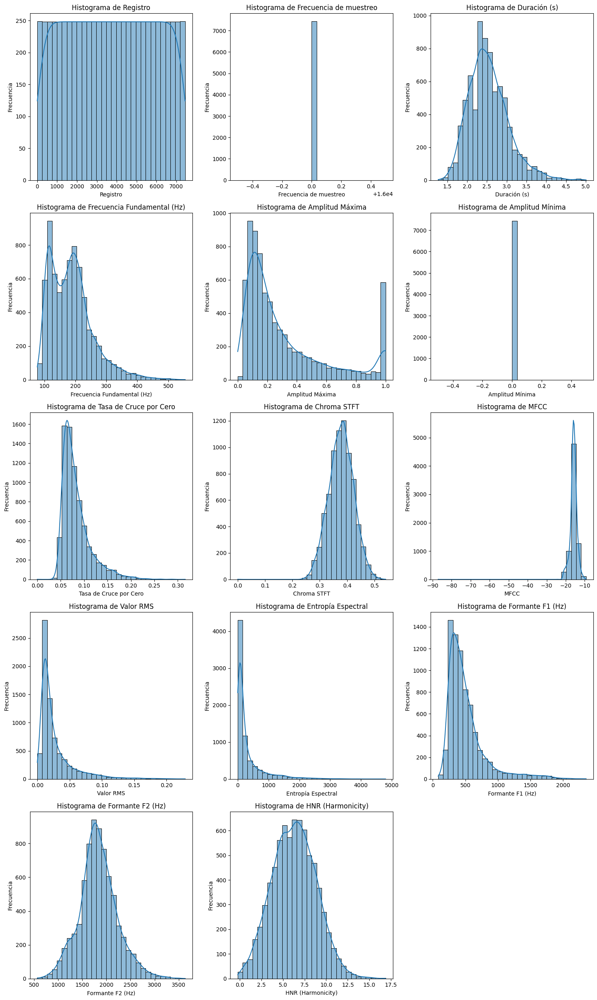

In [ ]:
# Filtrar columnas numéricas
num_cols = emotion_df.select_dtypes(include=[np.number]).columns.tolist()
n = len(num_cols)
n_cols = 3  # Cambia esto si quieres más o menos columnas
n_rows = (n + n_cols - 1) // n_cols  # Calcular el número de filas necesarias

plt.figure(figsize=(15, n_rows * 5))  # Ajustar el tamaño de la figura

for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)  # Ajustar el número de filas y columnas
    sns.histplot(emotion_df[col].dropna(), bins=30, kde=True)
    plt.title(f'Histograma de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

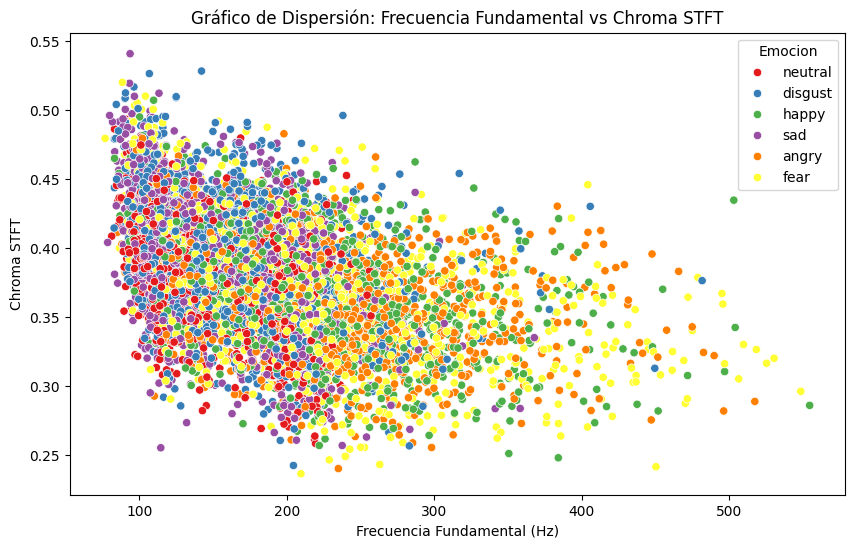

In [ ]:
# Crear gráficos de dispersión para las dos primeras características numéricas
plt.figure(figsize=(10, 6))
sns.scatterplot(data=emotion_df, x='Frecuencia Fundamental (Hz)', y='Chroma STFT', hue='Emocion', palette='Set1')
plt.title('Gráfico de Dispersión: Frecuencia Fundamental vs Chroma STFT')
plt.xlabel('Frecuencia Fundamental (Hz)')
plt.ylabel('Chroma STFT')
plt.show()


<ipython-input-29-71ef0a387a2c>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

Se

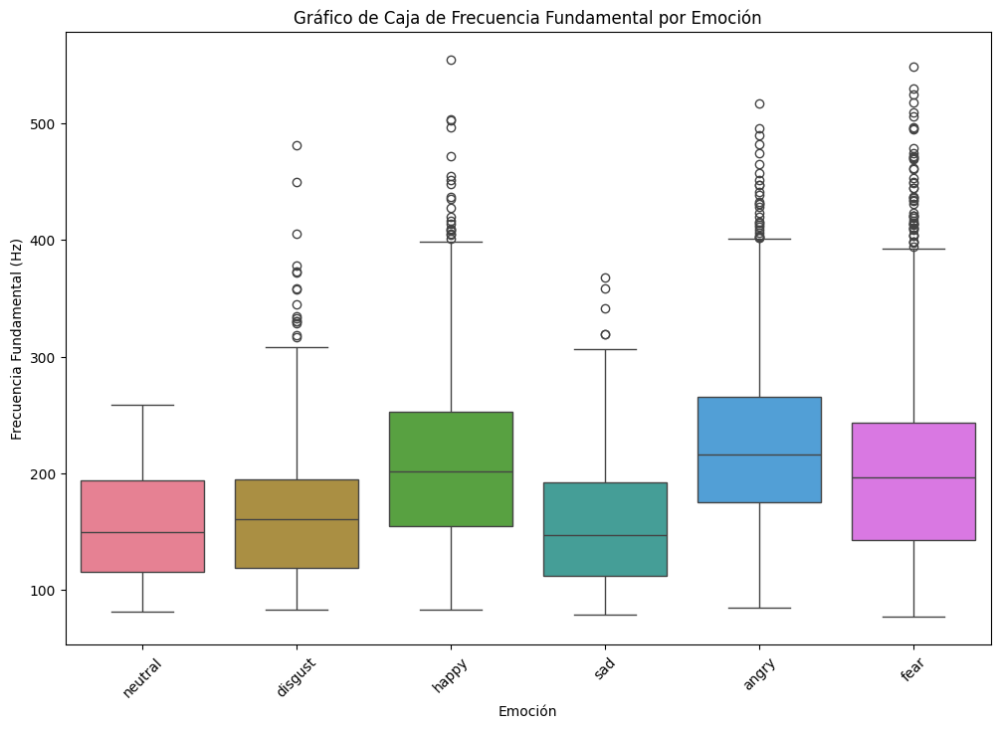

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=emotion_df, x='Emocion', y='Frecuencia Fundamental (Hz)', palette='husl')
plt.title('Gráfico de Caja de Frecuencia Fundamental por Emoción')
plt.xlabel('Emoción')
plt.ylabel('Frecuencia Fundamental (Hz)')
plt.xticks(rotation=45)
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` 

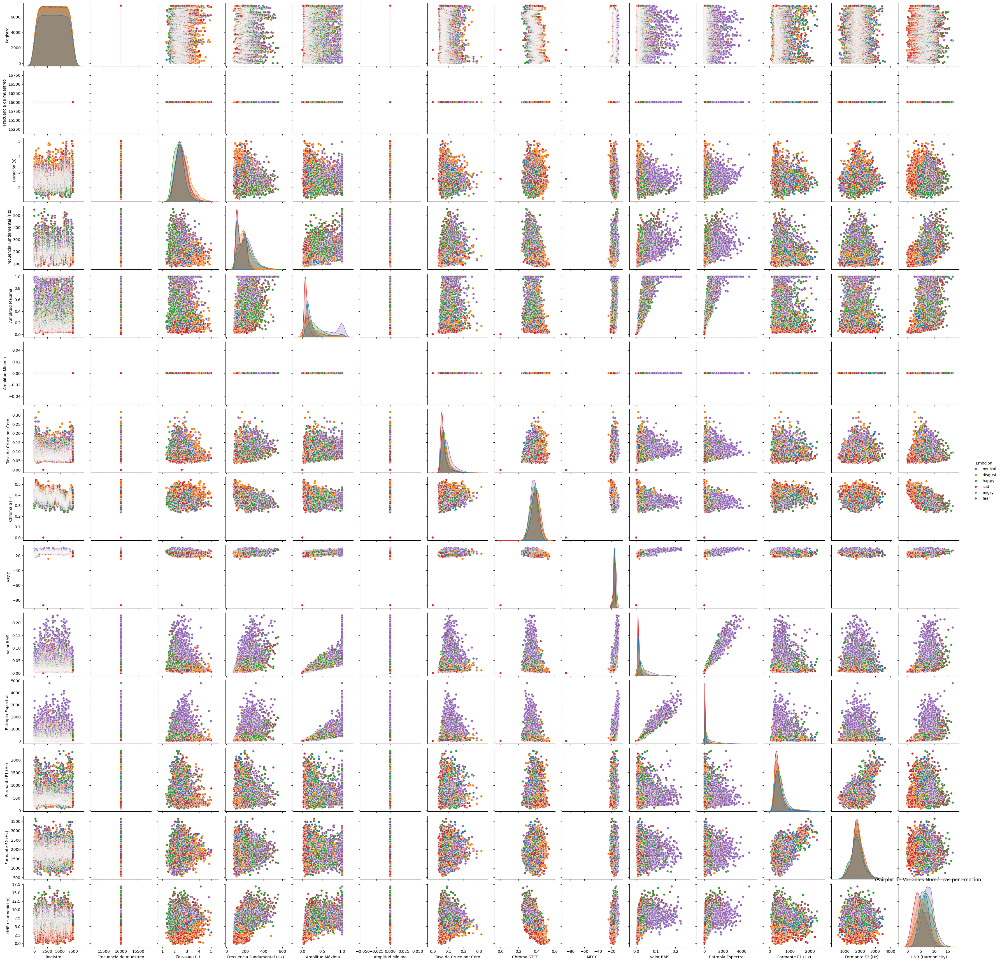

In [ ]:
# Pairplot de variables numéricas
sns.pairplot(emotion_df, hue='Emocion', diag_kind='kde')
plt.title('Pairplot de Variables Numéricas por Emoción')
plt.show()


In [ ]:
# 1. Cargar los datos desde un archivo CSV
try:
    emotion_df = pd.read_csv('/content/drive/MyDrive/emotion_audio_features.csv')
except FileNotFoundError:
    print("Error: El archivo no fue encontrado. Verifica la ruta.")
    raise
except Exception as e:
    print("Error al cargar el archivo:", e)
    raise

In [ ]:
# 2. Verificar si el DataFrame está vacío
if emotion_df.empty:
    print("Error: El DataFrame está vacío. Verifica los datos.")
else:
    print("Datos cargados correctamente.")


Datos cargados correctamente.


In [ ]:
# Mostrar las primeras filas del DataFrame para verificar la carga de datos
print(emotion_df.head())

   Registro  Emocion                                               Path  \
0         1  neutral  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
1         2  disgust  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
2         3    happy  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
3         4      sad  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_T...   
4         5    happy  /content/drive/MyDrive/CREMA-D/AudioWAV/1079_W...   

   Frecuencia de muestreo  Duración (s)  Frecuencia Fundamental (Hz)  \
0                   16000      2.502500                   115.055766   
1                   16000      3.303313                   178.549194   
2                   16000      2.369063                   344.494855   
3                   16000      3.169812                   187.379523   
4                   16000      2.736063                   496.760788   

   Amplitud Máxima  Amplitud Mínima  Tasa de Cruce por Cero  \
0         0.100647              0.0                0.

In [ ]:
# Cargar los datos desde un archivo CSV
emotion_df = pd.read_csv('/content/drive/MyDrive/emotion_audio_features.csv')

# Preparar los datos
X = emotion_df.drop(columns=['Registro', 'Emocion', 'Path'])  # Ajusta según tus necesidades
y = emotion_df['Emocion']

# Convertir Chroma STFT y MFCC a columnas numéricas
X_chroma = pd.DataFrame(X['Chroma STFT'].tolist(), index=X.index)
X_mfcc = pd.DataFrame(X['MFCC'].tolist(), index=X.index)

# Combinar y limpiar los datos
X = X.drop(columns=['Chroma STFT', 'MFCC'], errors='ignore')
X = pd.concat([X, X_chroma, X_mfcc], axis=1)

# Convertir todo a numérico, forzando errores a NaN
X = X.apply(pd.to_numeric, errors='coerce')

# Rellenar los valores NaN con la media de cada columna
X.fillna(X.mean(), inplace=True)

# Convertir los nombres de las columnas a cadenas
X.columns = X.columns.astype(str)

# Verificar que todos los datos son numéricos
print("Tipos de datos en X antes de la normalización:\n", X.dtypes)

# Dividir los datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


Tipos de datos en X antes de la normalización:
 Frecuencia de muestreo           int64
Duración (s)                   float64
Frecuencia Fundamental (Hz)    float64
Amplitud Máxima                float64
Amplitud Mínima                float64
Tasa de Cruce por Cero         float64
Valor RMS                      float64
Entropía Espectral             float64
Formante F1 (Hz)               float64
Formante F2 (Hz)               float64
HNR (Harmonicity)              float64
0                              float64
0                              float64
dtype: object


# Modelado de datos

In [ ]:
# Normalizar las características usando MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:695: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:712: RuntimeWarning:

All-NaN slice encountered



In [ ]:
# Crear y entrenar el modelo Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [ ]:
# Evaluar el modelo
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       angry       0.60      0.68      0.64       370
     disgust       0.41      0.33      0.36       381
        fear       0.42      0.22      0.29       382
       happy       0.43      0.42      0.43       393
     neutral       0.39      0.54      0.45       327
         sad       0.47      0.58      0.52       380

    accuracy                           0.46      2233
   macro avg       0.45      0.46      0.45      2233
weighted avg       0.45      0.46      0.45      2233



In [ ]:
# Importar librerías necesarias
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical

In [ ]:
# Convertir etiquetas de emociones a números
label_encoder = LabelEncoder()
emotion_labels = label_encoder.fit_transform(emotion_df['Emocion'])
emotion_labels = to_categorical(emotion_labels)  # Convertir a one-hot encoding

In [ ]:
# Seleccionar las características
features = emotion_df[['Frecuencia de muestreo', 'Duración (s)', 'Frecuencia Fundamental (Hz)',
                       'Amplitud Máxima', 'Amplitud Mínima', 'Tasa de Cruce por Cero',
                       'Valor RMS', 'Entropía Espectral', 'Formante F1 (Hz)',
                       'Formante F2 (Hz)', 'HNR (Harmonicity)']].dropna()

In [ ]:
# Asegurarse de que las características y etiquetas coincidan en longitud
features = features[emotion_df['Frecuencia Fundamental (Hz)'].notna()]
emotion_labels = emotion_labels[:len(features)]


<ipython-input-51-d680e0146562>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [ ]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features.values, emotion_labels, test_size=0.2, random_state=42)

# Redimensionar los datos para LSTM (n_samples, timesteps, features)
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

In [ ]:
# Definir el modelo LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64))
model.add(Dropout(0.2))
model.add(Dense(y_train.shape[1], activation='softmax'))  # Número de emociones como salida

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
# Compilar el modelo
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [ ]:
# Entrenar el modelo
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1789 - loss: 1.7944 - val_accuracy: 0.1639 - val_loss: 1.7926
Epoch 2/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1746 - loss: 1.7927 - val_accuracy: 0.1666 - val_loss: 1.7909
Epoch 3/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1599 - loss: 1.7932 - val_accuracy: 0.1645 - val_loss: 1.7917
Epoch 4/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1732 - loss: 1.7917 - val_accuracy: 0.1625 - val_loss: 1.7915
Epoch 5/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1791 - loss: 1.7910 - val_accuracy: 0.1679 - val_loss: 1.7918
Epoch 6/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1784 - loss: 1.7901 - val_accuracy: 0.1666 - val_loss: 1.7935
Epoch 7/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1807 - loss: 1.7922 - val_accuracy: 0.1652 - val_loss: 1.7920
Epoch 8/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.1571 - loss: 1.7918 - val_accuracy: 0

In [ ]:
# Evaluar el modelo
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')


47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1440 - loss: 1.7915
Loss: 1.7909501791000366, Accuracy: 0.16252519190311432


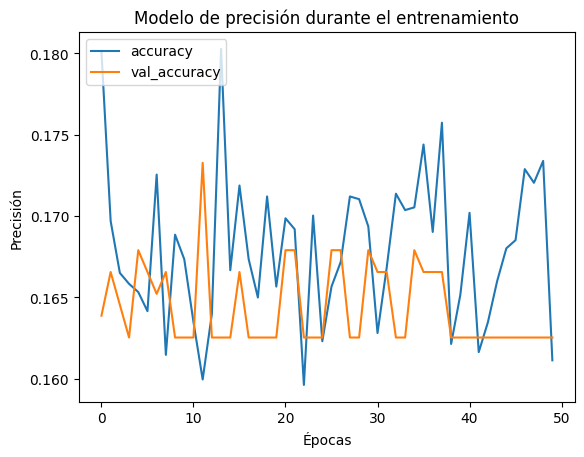

In [ ]:
# Gráfica del entrenamiento
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.title('Modelo de precisión durante el entrenamiento')
plt.ylabel('Precisión')
plt.xlabel('Épocas')
plt.legend(loc='upper left')
plt.show()